In [2]:
# imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler 
import torch.backends.cudnn as cudnn 
import numpy as np
import torchvision
from torchvision import datasets, models, transforms 
import matplotlib.pyplot as plt
import time
import os
import copy
import glob
import math
import itertools
import string
from PIL import Image
from tqdm import tqdm
from pathlib import Path
from PIL import Image
from IPython.display import display, Image, clear_output 
import ipywidgets as widgets
import threading

In [3]:
# set random seed for reproducability
torch.manual_seed(111)

In [4]:
# select the correct device
device = ""
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

In [5]:
import os
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader 
from PIL import Image

# establish data transforms
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    # transforms.Resize((28, 28)),
    transforms.Resize((64, 64)), 
    #transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize([0.485], [0.229])
])

# define dataset
class SingleClassImageFolder(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.img_names = [img for img in os.listdir(root_dir) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))] 
        
    def __len__(self):
        return len(self.img_names)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.img_names[idx])
        image = Image.open(img_path)
        image = image.convert('RGB') 
        if self.transform:
            image = self.transform(image)
        return image, 0 

data_dir = './data/train'
letters = os.listdir(data_dir)

gan_datasets = {}
gan_dataloaders = {}

# create new dataset for each letter
for letter in letters:
    letter_path = os.path.join(data_dir, letter) 
    if os.path.isdir(letter_path):
        gan_datasets[letter] = SingleClassImageFolder(root_dir=letter_path, transform=transform)
        gan_dataloaders[letter] = DataLoader(gan_datasets[letter],batch_size=32, shuffle=True, num_workers=0)

print(gan_dataloaders['A'])

In [6]:
# show image, adapted from the professor's PyTorch notebook
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0)) 
    mean = np.array([0.485, 0.456, 0.406]) 
    std = np.array([0.229, 0.224, 0.225]) 
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1) 
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

torch.Size([32, 1, 64, 64])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([3, 266, 530])


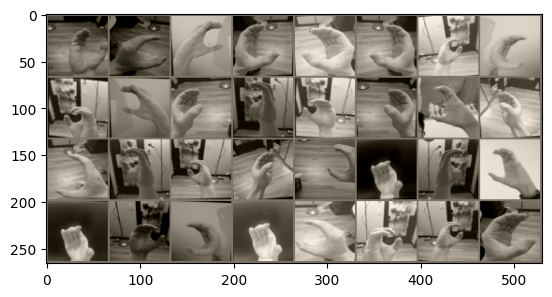

In [7]:
# show a batch, also adapted from the professor's PyTorch notebook
inputs, classes = next(iter(gan_dataloaders['C']))
print(inputs.shape)
print(classes)

out = torchvision.utils.make_grid(inputs)
print(out.shape)
imshow(out)

In [7]:
# define discriminator model
class Discriminator(nn.Module): 
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(nn.Linear(4096, 2048),
            nn.Dropout(0.3),
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1),
            nn.Sigmoid(),
        )
    
    def forward(self, x):
        x = x.view(x.size(0), 4096)
        output = self.model(x)
        return output
    
discriminator = Discriminator().to(device)

In [8]:
# define generator model
class Generator(nn.Module): 
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 4096),
            nn.Tanh(),
        )
        
    def forward(self, x):
        output = self.model(x)
        output = output.view(x.size(0), 1, 64, 64) 
        return output

generator = Generator().to(device)

In [9]:
# define function to show images in grid
def show_asl(num_images, num_rows, num_cols, generated_samples):
    
    plt.figure(figsize=(64, 64))

    for i in range(num_images):
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(generated_samples[i].reshape(64,64), cmap='gray')
        plt.axis('off') 

    plt.tight_layout()
    plt.show()

In [10]:
# define hyperparameters
lr = 0.0001
num_epochs = 50
loss_function = nn.BCELoss()
optimizer_discriminator = torch.optim.Adam(discriminator.parameters(), lr=lr)
optimizer_generator = torch.optim.Adam(generator.parameters(), lr=lr)

Starting training for letter: R
Completed Epoch 1/50, Epoch Duration: 0.24s, Total Loss D.: 0.0315, Total Loss G.: 6.3561
Completed Epoch 2/50, Epoch Duration: 0.14s, Total Loss D.: 0.0339, Total Loss G.: 6.6583
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.0252, Total Loss G.: 8.2776
Completed Epoch 4/50, Epoch Duration: 0.14s, Total Loss D.: 0.0072, Total Loss G.: 7.8228
Completed Epoch 5/50, Epoch Duration: 0.14s, Total Loss D.: 0.0595, Total Loss G.: 7.2159
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0205, Total Loss G.: 6.9104
Completed Epoch 7/50, Epoch Duration: 0.14s, Total Loss D.: 0.0081, Total Loss G.: 7.1453
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.0170, Total Loss G.: 6.4222
Completed Epoch 9/50, Epoch Duration: 0.18s, Total Loss D.: 0.5477, Total Loss G.: 5.9733
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0603, Total Loss G.: 5.5047
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0440

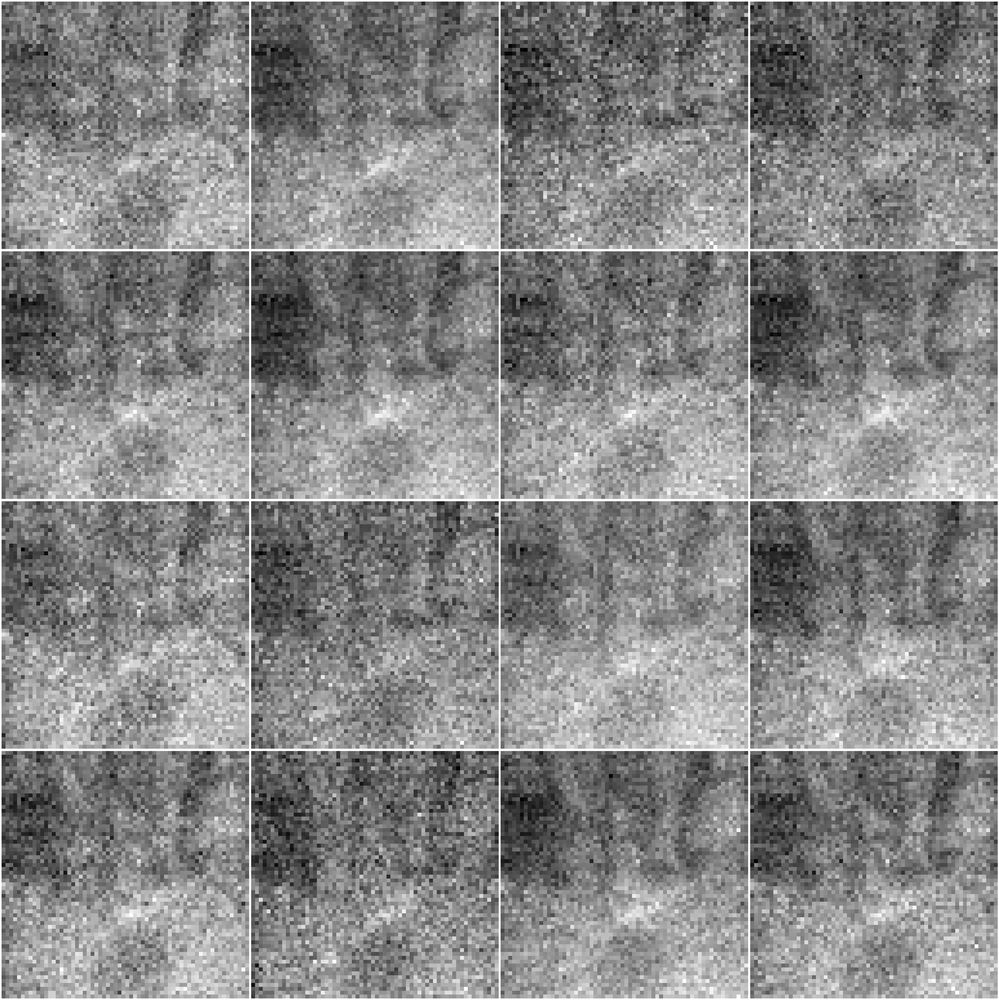

Starting training for letter: U
Completed Epoch 1/50, Epoch Duration: 0.18s, Total Loss D.: 2.2087, Total Loss G.: 2.9187
Completed Epoch 2/50, Epoch Duration: 0.17s, Total Loss D.: 0.5069, Total Loss G.: 2.3209
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.0849, Total Loss G.: 5.5581
Completed Epoch 4/50, Epoch Duration: 0.14s, Total Loss D.: 1.6029, Total Loss G.: 8.3404
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0150, Total Loss G.: 7.3779
Completed Epoch 6/50, Epoch Duration: 0.14s, Total Loss D.: 0.0325, Total Loss G.: 3.8685
Completed Epoch 7/50, Epoch Duration: 0.14s, Total Loss D.: 0.4104, Total Loss G.: 1.9693
Completed Epoch 8/50, Epoch Duration: 0.14s, Total Loss D.: 0.3848, Total Loss G.: 4.2104
Completed Epoch 9/50, Epoch Duration: 0.14s, Total Loss D.: 0.1141, Total Loss G.: 6.5582
Completed Epoch 10/50, Epoch Duration: 0.14s, Total Loss D.: 0.0598, Total Loss G.: 7.6442
Completed Epoch 11/50, Epoch Duration: 0.14s, Total Loss D.: 0.1705

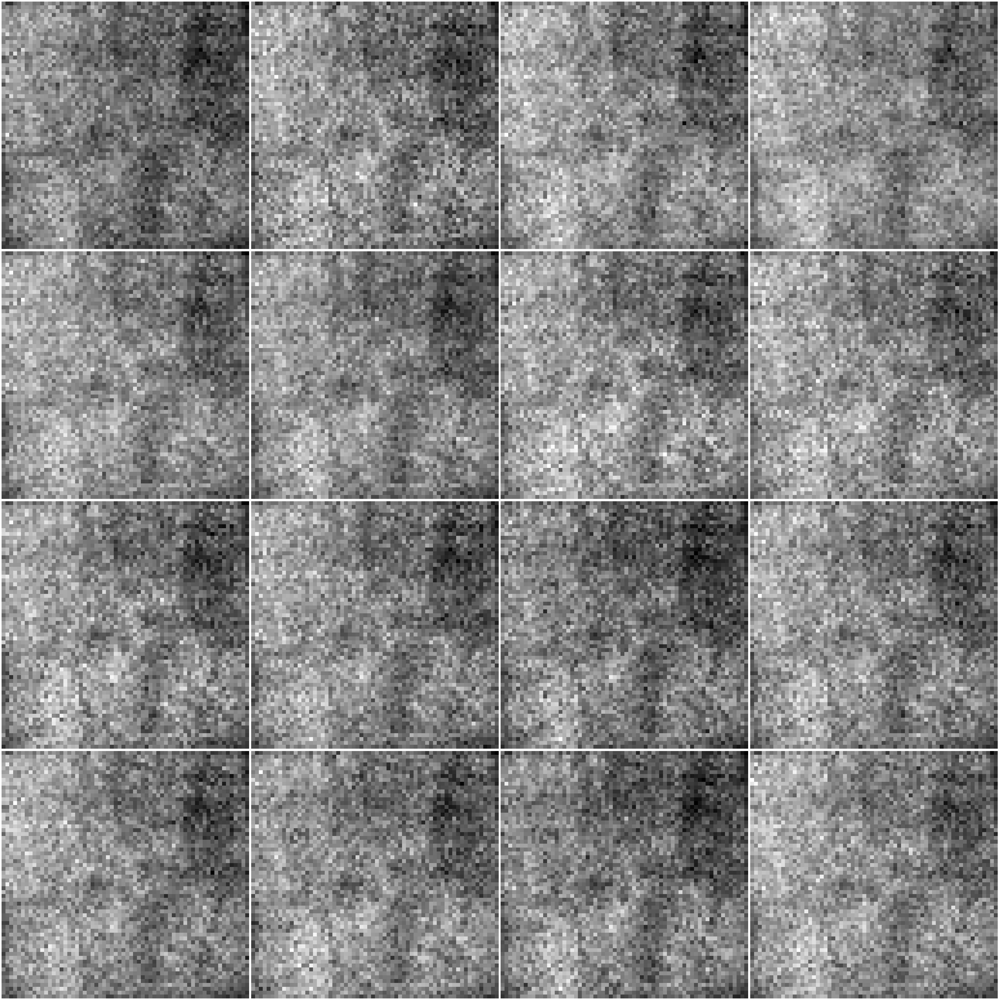

Starting training for letter: I
Completed Epoch 1/50, Epoch Duration: 0.23s, Total Loss D.: 2.8636, Total Loss G.: 4.5787
Completed Epoch 2/50, Epoch Duration: 0.21s, Total Loss D.: 0.2117, Total Loss G.: 2.0135
Completed Epoch 3/50, Epoch Duration: 0.21s, Total Loss D.: 0.0303, Total Loss G.: 6.1324
Completed Epoch 4/50, Epoch Duration: 0.21s, Total Loss D.: 0.0193, Total Loss G.: 7.0677
Completed Epoch 5/50, Epoch Duration: 0.22s, Total Loss D.: 0.0179, Total Loss G.: 5.3096
Completed Epoch 6/50, Epoch Duration: 0.21s, Total Loss D.: 0.0179, Total Loss G.: 4.5915
Completed Epoch 7/50, Epoch Duration: 0.21s, Total Loss D.: 0.0469, Total Loss G.: 3.5603
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.1930, Total Loss G.: 4.0494
Completed Epoch 9/50, Epoch Duration: 0.21s, Total Loss D.: 0.0640, Total Loss G.: 3.6841
Completed Epoch 10/50, Epoch Duration: 0.24s, Total Loss D.: 0.0509, Total Loss G.: 4.8101
Completed Epoch 11/50, Epoch Duration: 0.22s, Total Loss D.: 0.0267

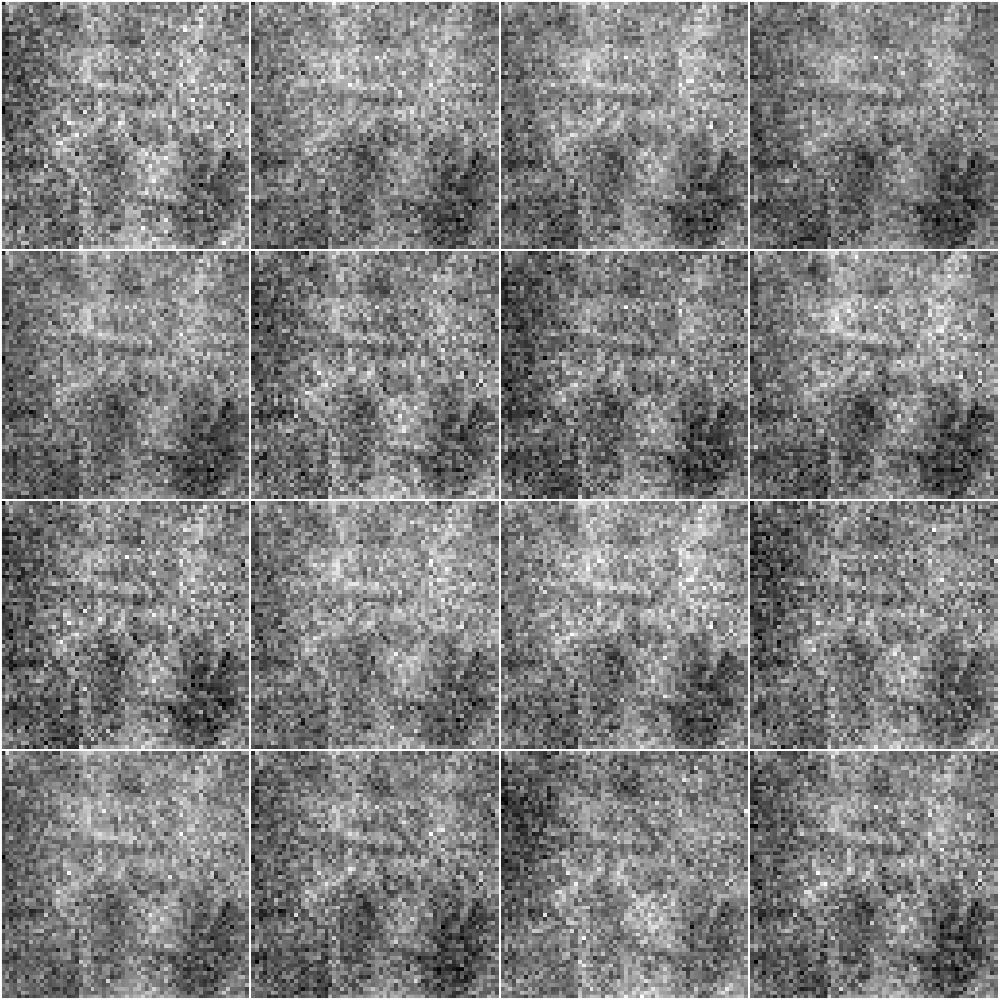

Starting training for letter: N
Completed Epoch 1/50, Epoch Duration: 0.17s, Total Loss D.: 0.0973, Total Loss G.: 7.9112
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.0123, Total Loss G.: 6.7620
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.0288, Total Loss G.: 5.7473
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.0802, Total Loss G.: 5.1615
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.1615, Total Loss G.: 4.9547
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.1363, Total Loss G.: 6.2390
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.0310, Total Loss G.: 6.3904
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.2678, Total Loss G.: 5.6687
Completed Epoch 9/50, Epoch Duration: 0.14s, Total Loss D.: 0.0724, Total Loss G.: 4.2424
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.1507, Total Loss G.: 3.1460
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.1530

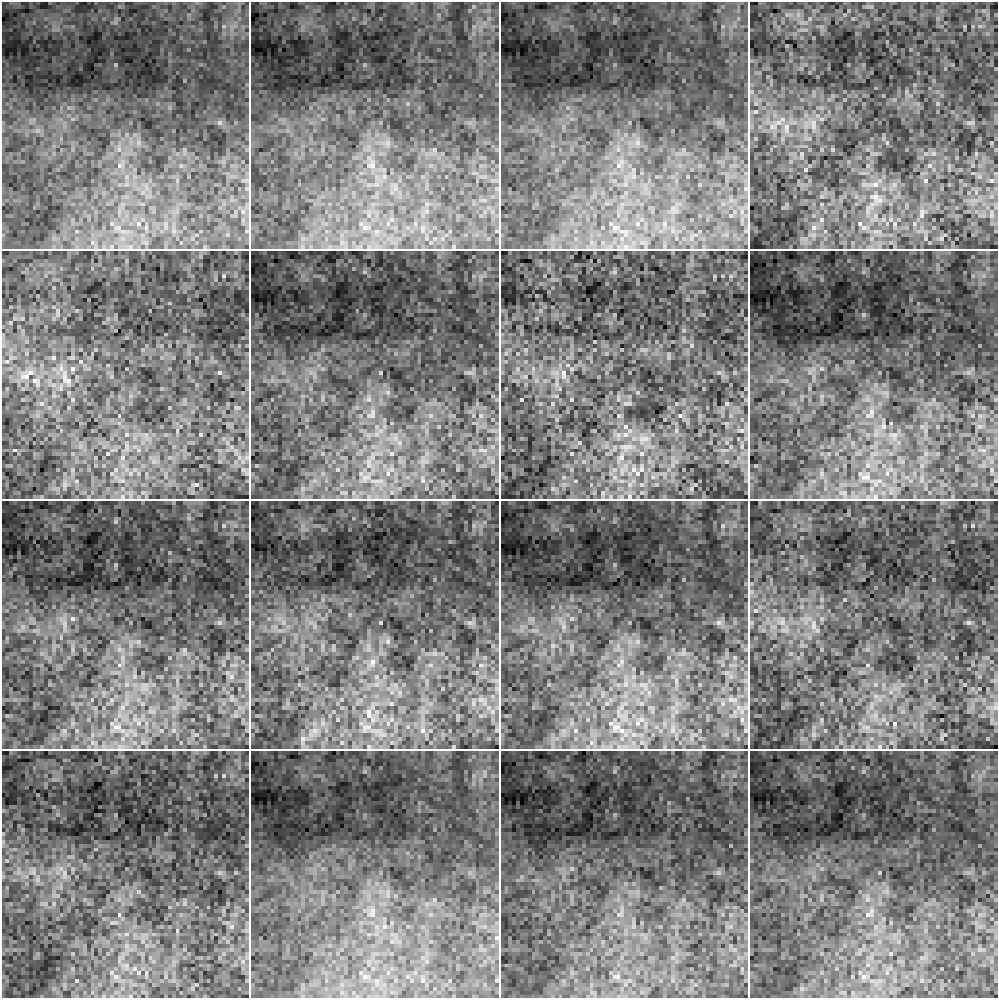

Starting training for letter: G
Completed Epoch 1/50, Epoch Duration: 0.16s, Total Loss D.: 0.1506, Total Loss G.: 2.2073
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.2016, Total Loss G.: 2.2996
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.1191, Total Loss G.: 3.7052
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.1198, Total Loss G.: 4.1097
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0341, Total Loss G.: 5.0394
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0158, Total Loss G.: 4.2706
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.0147, Total Loss G.: 3.4657
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.0399, Total Loss G.: 3.5235
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0783, Total Loss G.: 3.5138
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.1019, Total Loss G.: 4.0585
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0430

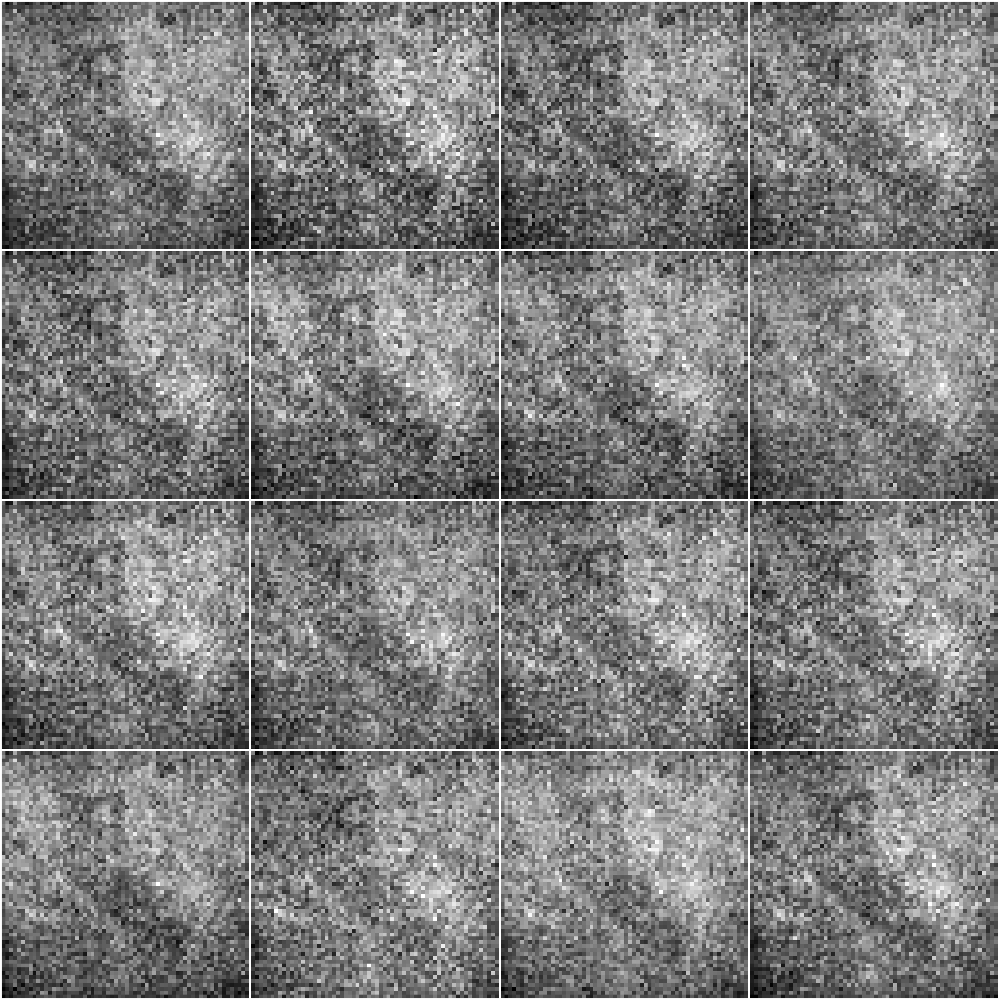

Starting training for letter: Z
Completed Epoch 1/50, Epoch Duration: 0.26s, Total Loss D.: 0.0132, Total Loss G.: 4.3259
Completed Epoch 2/50, Epoch Duration: 0.22s, Total Loss D.: 0.0400, Total Loss G.: 4.3166
Completed Epoch 3/50, Epoch Duration: 0.25s, Total Loss D.: 0.0365, Total Loss G.: 4.5986
Completed Epoch 4/50, Epoch Duration: 0.22s, Total Loss D.: 0.0038, Total Loss G.: 4.6908
Completed Epoch 5/50, Epoch Duration: 0.22s, Total Loss D.: 0.0080, Total Loss G.: 5.8871
Completed Epoch 6/50, Epoch Duration: 0.30s, Total Loss D.: 0.0255, Total Loss G.: 5.6245
Completed Epoch 7/50, Epoch Duration: 0.23s, Total Loss D.: 0.0023, Total Loss G.: 5.0976
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.0143, Total Loss G.: 6.2363
Completed Epoch 9/50, Epoch Duration: 0.24s, Total Loss D.: 0.0112, Total Loss G.: 3.9592
Completed Epoch 10/50, Epoch Duration: 0.25s, Total Loss D.: 0.0138, Total Loss G.: 4.8557
Completed Epoch 11/50, Epoch Duration: 0.23s, Total Loss D.: 1.1574

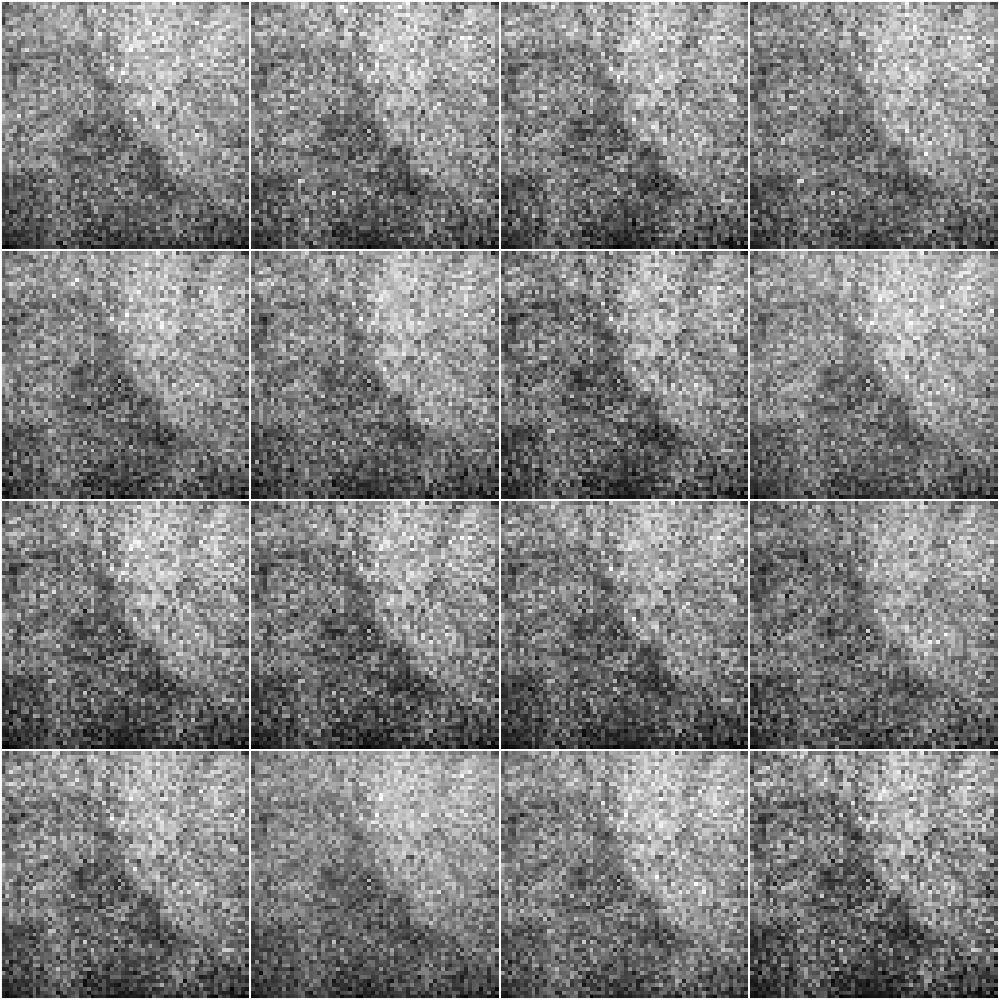

Starting training for letter: T
Completed Epoch 1/50, Epoch Duration: 0.16s, Total Loss D.: 2.0619, Total Loss G.: 5.1422
Completed Epoch 2/50, Epoch Duration: 0.14s, Total Loss D.: 1.8451, Total Loss G.: 3.9294
Completed Epoch 3/50, Epoch Duration: 0.14s, Total Loss D.: 0.1734, Total Loss G.: 4.6149
Completed Epoch 4/50, Epoch Duration: 0.14s, Total Loss D.: 0.1241, Total Loss G.: 4.5479
Completed Epoch 5/50, Epoch Duration: 0.14s, Total Loss D.: 0.0707, Total Loss G.: 7.6961
Completed Epoch 6/50, Epoch Duration: 0.14s, Total Loss D.: 0.1314, Total Loss G.: 6.7725
Completed Epoch 7/50, Epoch Duration: 0.14s, Total Loss D.: 0.1834, Total Loss G.: 9.8706
Completed Epoch 8/50, Epoch Duration: 0.14s, Total Loss D.: 0.2258, Total Loss G.: 9.7666
Completed Epoch 9/50, Epoch Duration: 0.13s, Total Loss D.: 0.5766, Total Loss G.: 5.6909
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0974, Total Loss G.: 6.7861
Completed Epoch 11/50, Epoch Duration: 0.14s, Total Loss D.: 0.1876

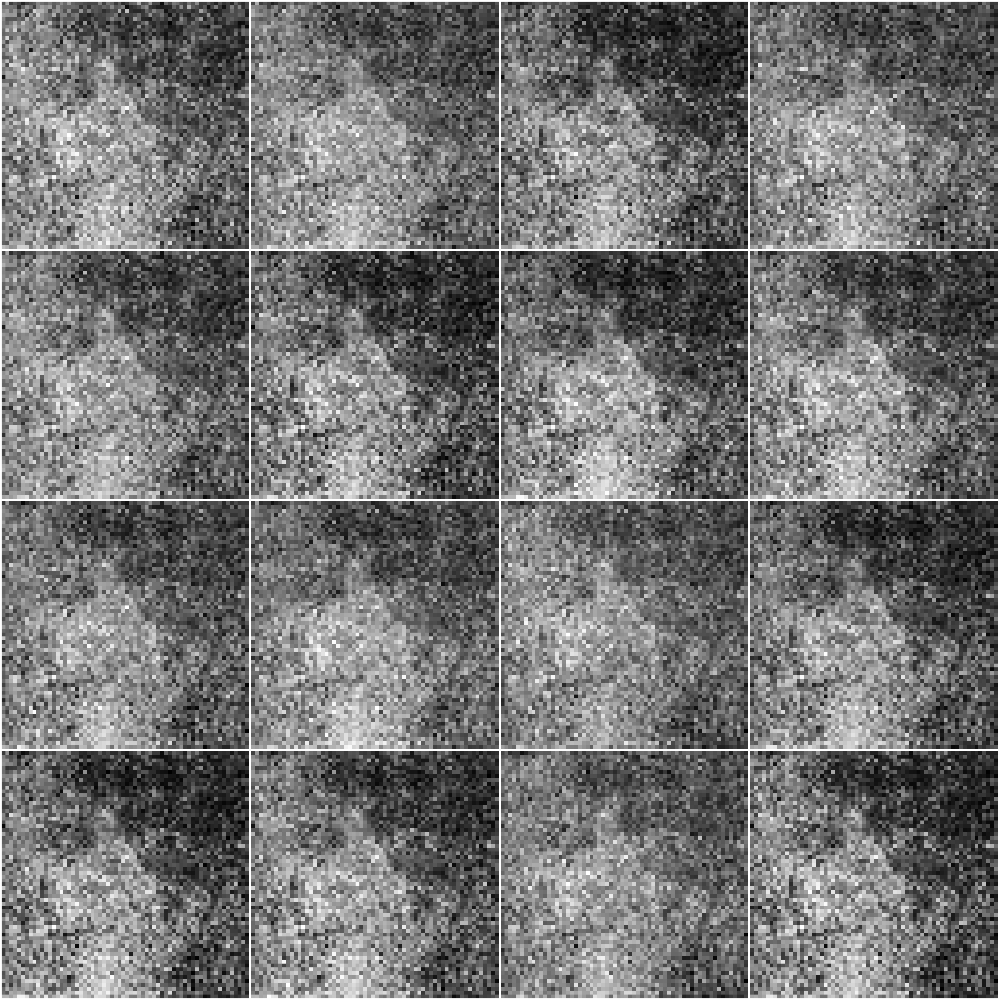

Starting training for letter: S
Completed Epoch 1/50, Epoch Duration: 0.24s, Total Loss D.: 1.0384, Total Loss G.: 6.2905
Completed Epoch 2/50, Epoch Duration: 0.22s, Total Loss D.: 2.1780, Total Loss G.: 2.1806
Completed Epoch 3/50, Epoch Duration: 0.22s, Total Loss D.: 1.3814, Total Loss G.: 4.4466
Completed Epoch 4/50, Epoch Duration: 0.22s, Total Loss D.: 0.0012, Total Loss G.: 6.7294
Completed Epoch 5/50, Epoch Duration: 0.22s, Total Loss D.: 0.0982, Total Loss G.: 9.2208
Completed Epoch 6/50, Epoch Duration: 0.22s, Total Loss D.: 0.0649, Total Loss G.: 5.9261
Completed Epoch 7/50, Epoch Duration: 0.22s, Total Loss D.: 0.0673, Total Loss G.: 4.3885
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 1.3801, Total Loss G.: 4.8836
Completed Epoch 9/50, Epoch Duration: 0.22s, Total Loss D.: 0.2253, Total Loss G.: 5.9578
Completed Epoch 10/50, Epoch Duration: 0.22s, Total Loss D.: 0.0659, Total Loss G.: 2.9424
Completed Epoch 11/50, Epoch Duration: 0.22s, Total Loss D.: 0.0707

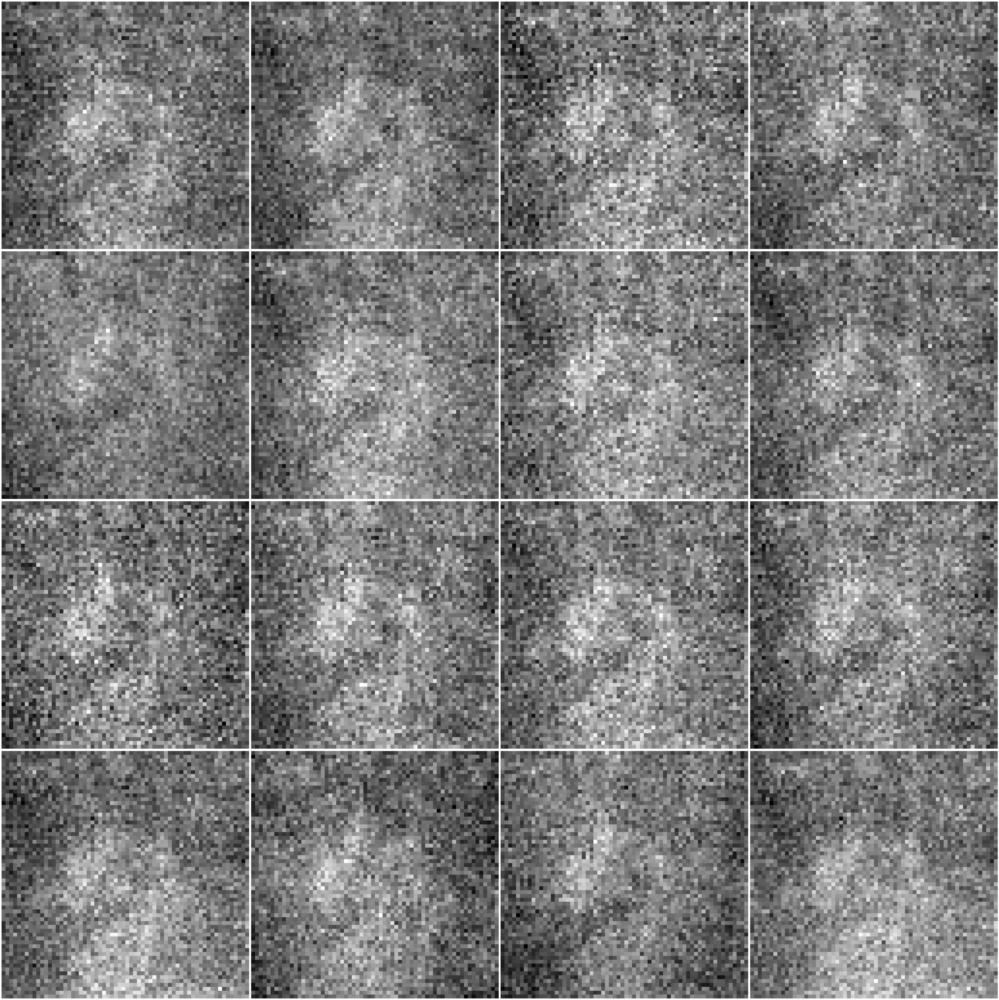

Starting training for letter: A
Completed Epoch 1/50, Epoch Duration: 0.24s, Total Loss D.: 0.4056, Total Loss G.: 1.3176
Completed Epoch 2/50, Epoch Duration: 0.22s, Total Loss D.: 0.6074, Total Loss G.: 1.1340
Completed Epoch 3/50, Epoch Duration: 0.22s, Total Loss D.: 0.2424, Total Loss G.: 1.0646
Completed Epoch 4/50, Epoch Duration: 0.22s, Total Loss D.: 0.1661, Total Loss G.: 1.8408
Completed Epoch 5/50, Epoch Duration: 0.22s, Total Loss D.: 0.1270, Total Loss G.: 3.0055
Completed Epoch 6/50, Epoch Duration: 0.22s, Total Loss D.: 0.3631, Total Loss G.: 2.4135
Completed Epoch 7/50, Epoch Duration: 0.22s, Total Loss D.: 0.1553, Total Loss G.: 0.7566
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.3767, Total Loss G.: 1.3501
Completed Epoch 9/50, Epoch Duration: 0.23s, Total Loss D.: 0.4210, Total Loss G.: 2.4756
Completed Epoch 10/50, Epoch Duration: 0.23s, Total Loss D.: 0.3389, Total Loss G.: 2.8532
Completed Epoch 11/50, Epoch Duration: 0.22s, Total Loss D.: 0.0780

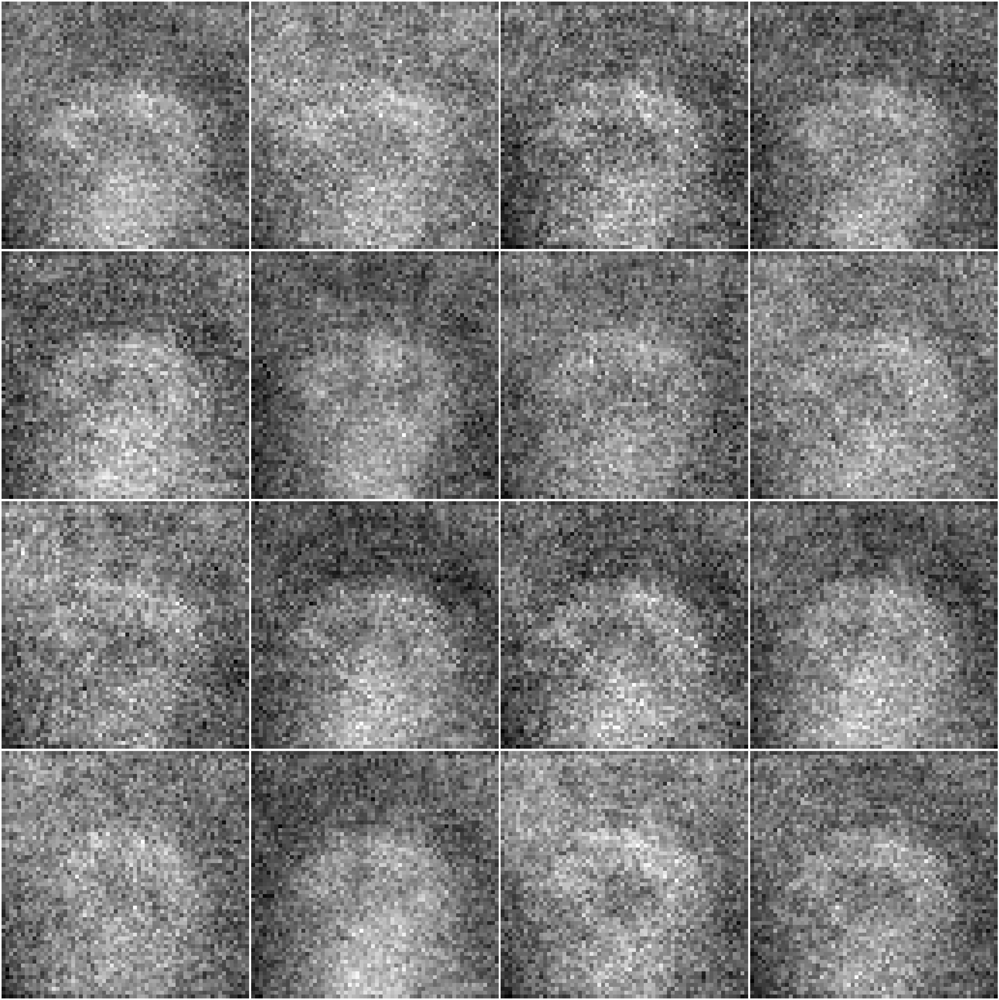

Starting training for letter: F
Completed Epoch 1/50, Epoch Duration: 0.17s, Total Loss D.: 0.4602, Total Loss G.: 2.0761
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.2459, Total Loss G.: 1.4286
Completed Epoch 3/50, Epoch Duration: 0.16s, Total Loss D.: 0.3213, Total Loss G.: 1.1613
Completed Epoch 4/50, Epoch Duration: 0.16s, Total Loss D.: 0.3020, Total Loss G.: 1.5842
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.3360, Total Loss G.: 2.4846
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0609, Total Loss G.: 2.2848
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.1475, Total Loss G.: 2.0739
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.1962, Total Loss G.: 1.6380
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.1930, Total Loss G.: 1.8408
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.1665, Total Loss G.: 2.0850
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.4161

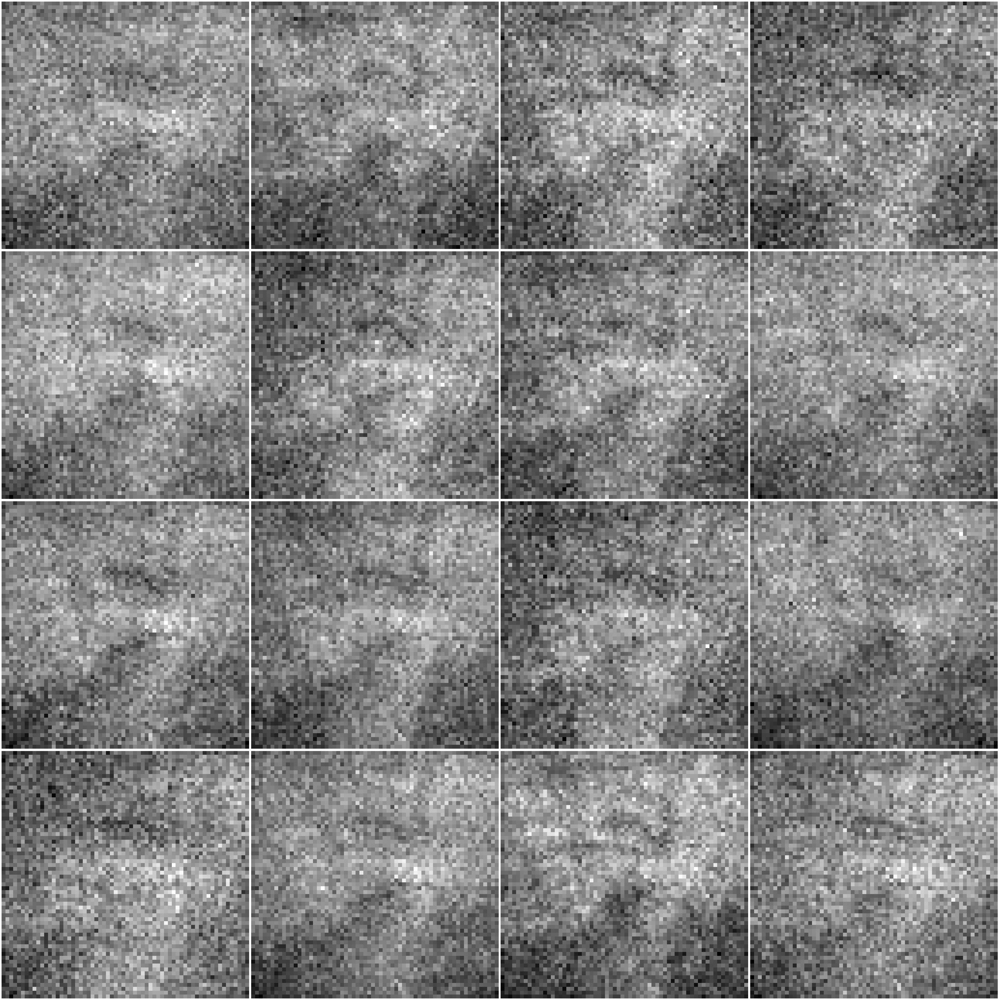

Starting training for letter: O
Completed Epoch 1/50, Epoch Duration: 0.22s, Total Loss D.: 0.6126, Total Loss G.: 1.3076
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.5073, Total Loss G.: 1.2626
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.3015, Total Loss G.: 1.4130
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.1280, Total Loss G.: 2.1299
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0958, Total Loss G.: 3.5028
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0165, Total Loss G.: 4.8764
Completed Epoch 7/50, Epoch Duration: 0.14s, Total Loss D.: 0.0143, Total Loss G.: 6.2037
Completed Epoch 8/50, Epoch Duration: 0.18s, Total Loss D.: 0.1689, Total Loss G.: 6.1706
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0256, Total Loss G.: 5.9411
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0498, Total Loss G.: 4.7321
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0863

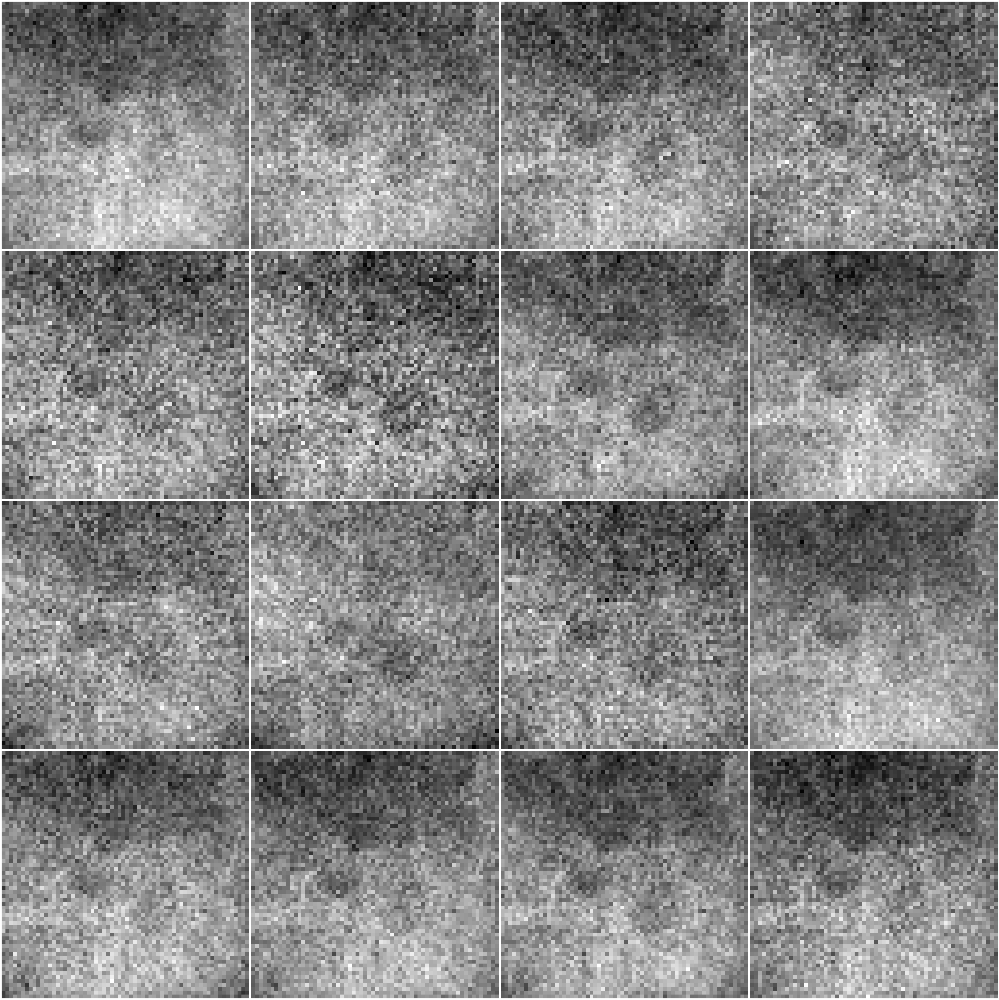

Starting training for letter: H
Completed Epoch 1/50, Epoch Duration: 0.23s, Total Loss D.: 0.3031, Total Loss G.: 2.7500
Completed Epoch 2/50, Epoch Duration: 0.16s, Total Loss D.: 0.1146, Total Loss G.: 3.5844
Completed Epoch 3/50, Epoch Duration: 0.16s, Total Loss D.: 0.1314, Total Loss G.: 3.3407
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.0413, Total Loss G.: 3.3540
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0837, Total Loss G.: 3.1816
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0857, Total Loss G.: 2.6208
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.0995, Total Loss G.: 2.1569
Completed Epoch 8/50, Epoch Duration: 0.14s, Total Loss D.: 0.1807, Total Loss G.: 1.7087
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.1949, Total Loss G.: 1.4274
Completed Epoch 10/50, Epoch Duration: 0.14s, Total Loss D.: 0.1824, Total Loss G.: 1.3978
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.1516

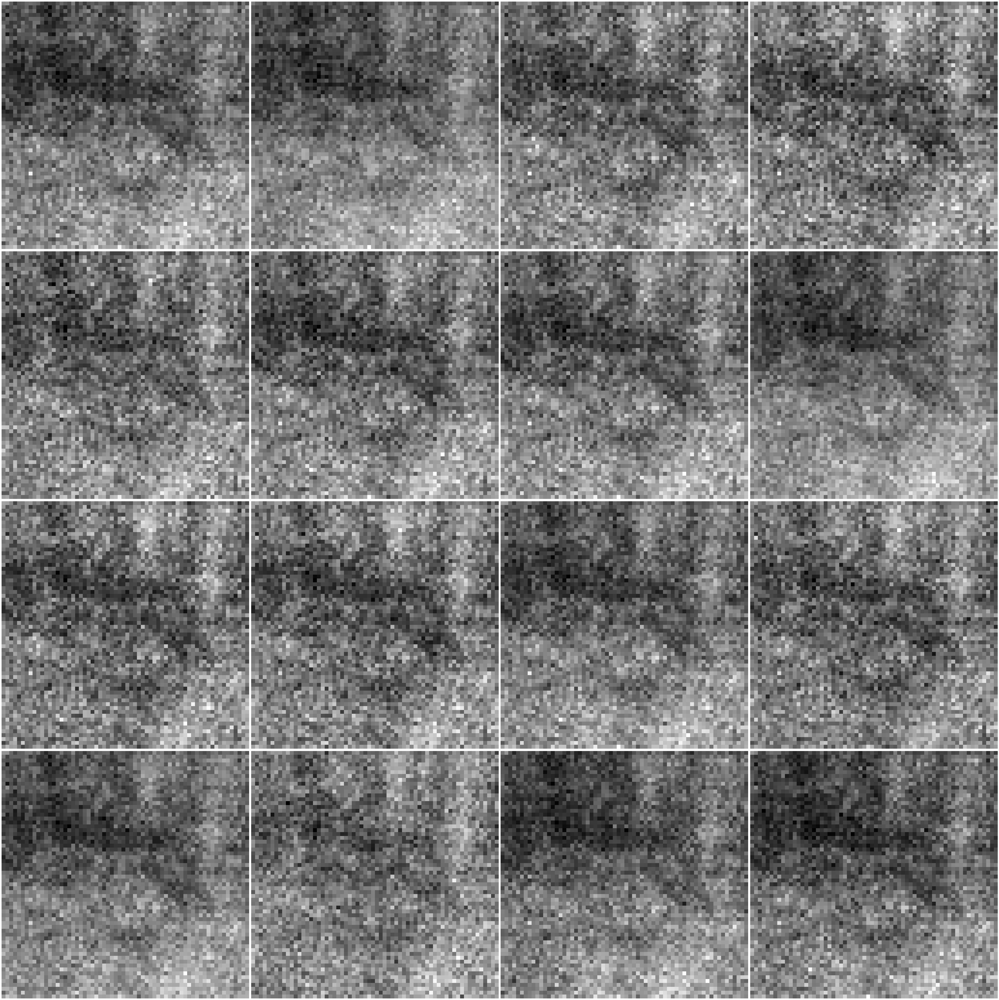

Starting training for letter: M
Completed Epoch 1/50, Epoch Duration: 0.16s, Total Loss D.: 0.3040, Total Loss G.: 2.8559
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.8347, Total Loss G.: 2.4793
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.1645, Total Loss G.: 2.0967
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.1062, Total Loss G.: 2.8446
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0407, Total Loss G.: 4.8504
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0069, Total Loss G.: 6.0047
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.3041, Total Loss G.: 5.9991
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.0248, Total Loss G.: 4.3484
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0663, Total Loss G.: 4.0183
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0544, Total Loss G.: 2.5823
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0962

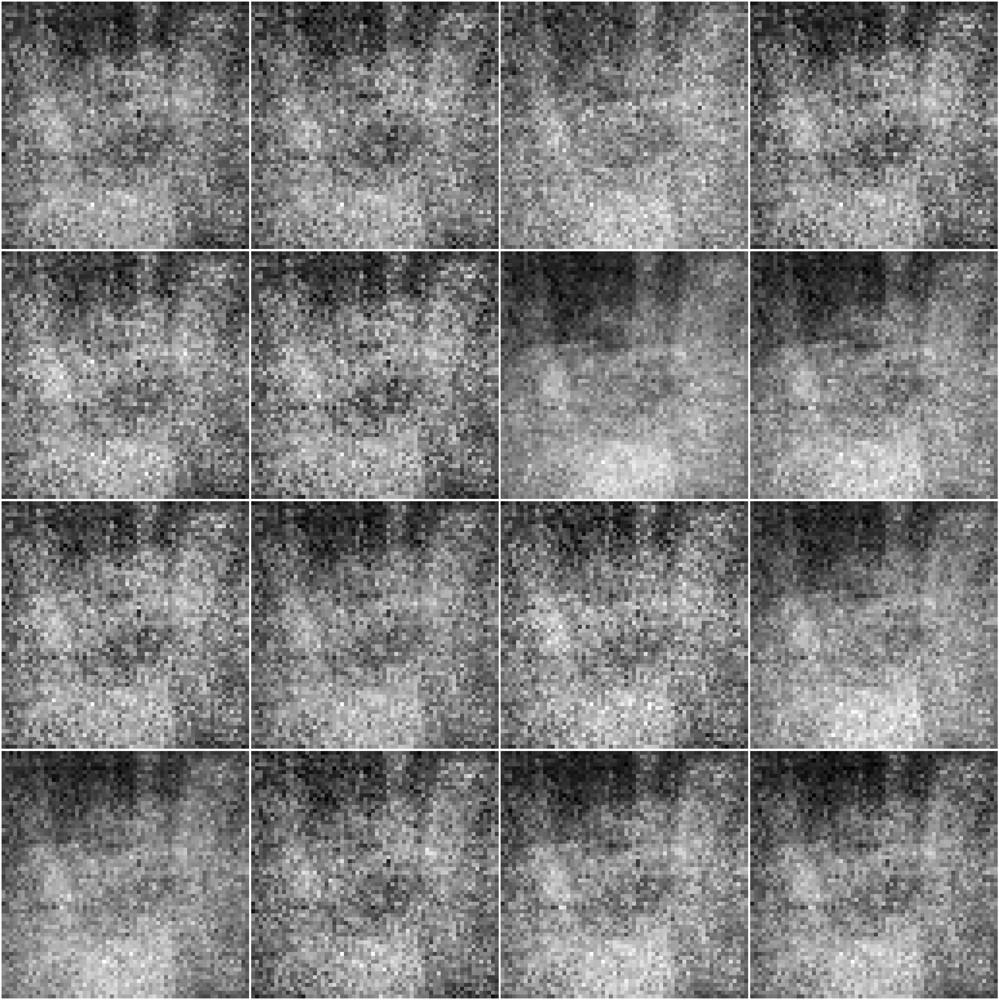

Starting training for letter: J
Completed Epoch 1/50, Epoch Duration: 0.24s, Total Loss D.: 0.2145, Total Loss G.: 5.2173
Completed Epoch 2/50, Epoch Duration: 0.21s, Total Loss D.: 0.0683, Total Loss G.: 5.8384
Completed Epoch 3/50, Epoch Duration: 0.23s, Total Loss D.: 0.0670, Total Loss G.: 5.4478
Completed Epoch 4/50, Epoch Duration: 0.23s, Total Loss D.: 0.0062, Total Loss G.: 5.2982
Completed Epoch 5/50, Epoch Duration: 0.23s, Total Loss D.: 0.0079, Total Loss G.: 4.9618
Completed Epoch 6/50, Epoch Duration: 0.22s, Total Loss D.: 0.0132, Total Loss G.: 4.6013
Completed Epoch 7/50, Epoch Duration: 0.22s, Total Loss D.: 0.1563, Total Loss G.: 3.8374
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.0255, Total Loss G.: 3.0416
Completed Epoch 9/50, Epoch Duration: 0.23s, Total Loss D.: 0.0411, Total Loss G.: 3.5947
Completed Epoch 10/50, Epoch Duration: 0.22s, Total Loss D.: 0.0288, Total Loss G.: 3.6475
Completed Epoch 11/50, Epoch Duration: 0.22s, Total Loss D.: 0.0286

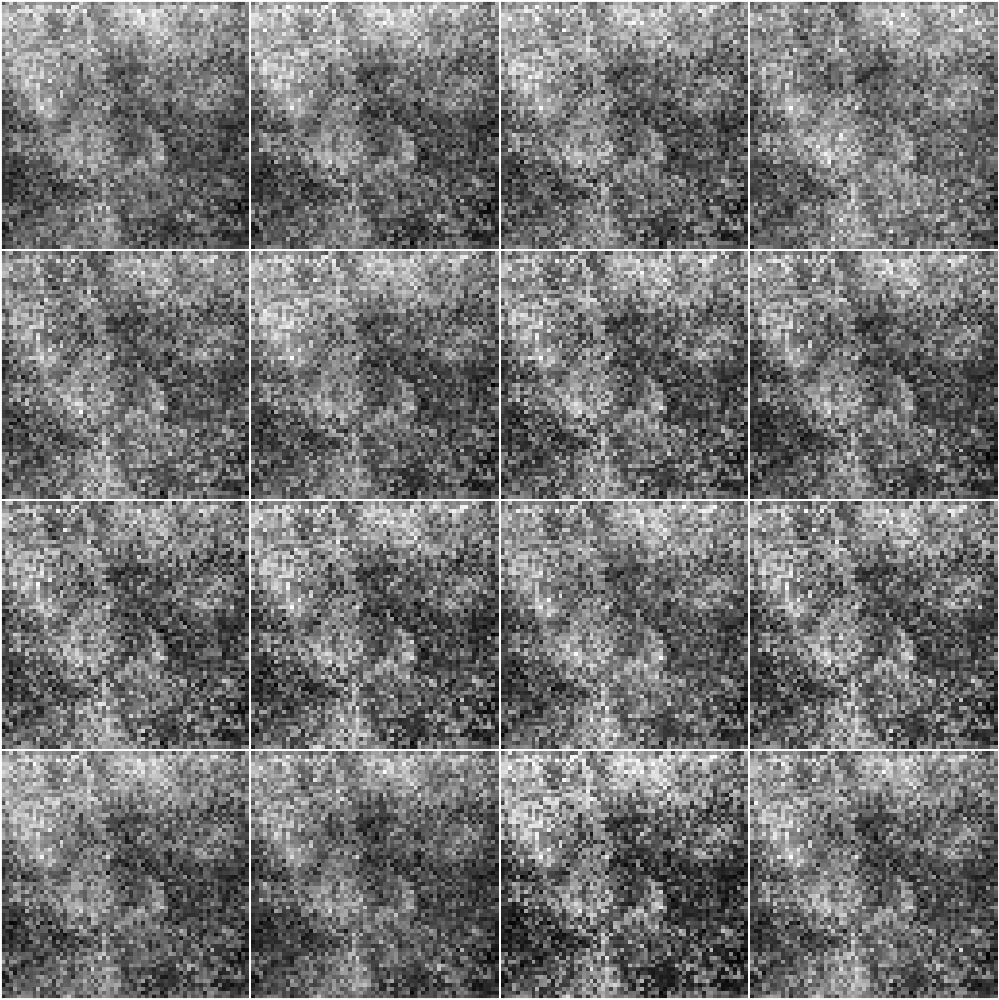

Starting training for letter: C
Completed Epoch 1/50, Epoch Duration: 0.19s, Total Loss D.: 4.5500, Total Loss G.: 4.3442
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 1.3998, Total Loss G.: 3.6760
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.2386, Total Loss G.: 3.6414
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.1074, Total Loss G.: 6.9230
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0447, Total Loss G.: 9.3826
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0065, Total Loss G.: 9.3020
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.1537, Total Loss G.: 8.1332
Completed Epoch 8/50, Epoch Duration: 0.16s, Total Loss D.: 0.0186, Total Loss G.: 8.2664
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0276, Total Loss G.: 7.8559
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0925, Total Loss G.: 5.7875
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.2045

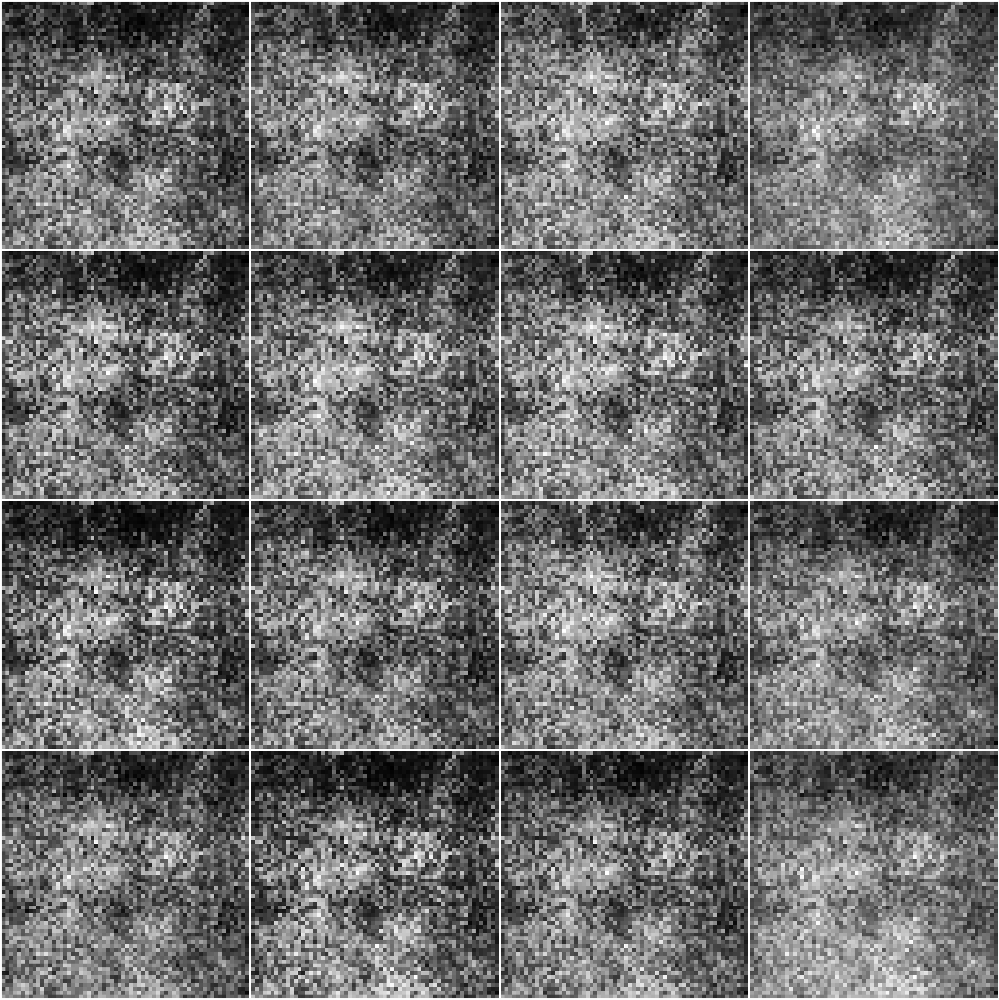

Starting training for letter: D
Completed Epoch 1/50, Epoch Duration: 0.58s, Total Loss D.: 0.0014, Total Loss G.: 4.5121
Completed Epoch 2/50, Epoch Duration: 0.25s, Total Loss D.: 0.0277, Total Loss G.: 5.0555
Completed Epoch 3/50, Epoch Duration: 0.23s, Total Loss D.: 0.0158, Total Loss G.: 7.1410
Completed Epoch 4/50, Epoch Duration: 0.22s, Total Loss D.: 0.3530, Total Loss G.: 2.0613
Completed Epoch 5/50, Epoch Duration: 0.23s, Total Loss D.: 0.0396, Total Loss G.: 1.2636
Completed Epoch 6/50, Epoch Duration: 0.23s, Total Loss D.: 0.4798, Total Loss G.: 13.6992
Completed Epoch 7/50, Epoch Duration: 0.24s, Total Loss D.: 0.0000, Total Loss G.: 16.3056
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.0000, Total Loss G.: 15.7593
Completed Epoch 9/50, Epoch Duration: 0.21s, Total Loss D.: 0.0000, Total Loss G.: 12.4911
Completed Epoch 10/50, Epoch Duration: 0.22s, Total Loss D.: 0.0002, Total Loss G.: 11.7086
Completed Epoch 11/50, Epoch Duration: 0.22s, Total Loss D.: 0

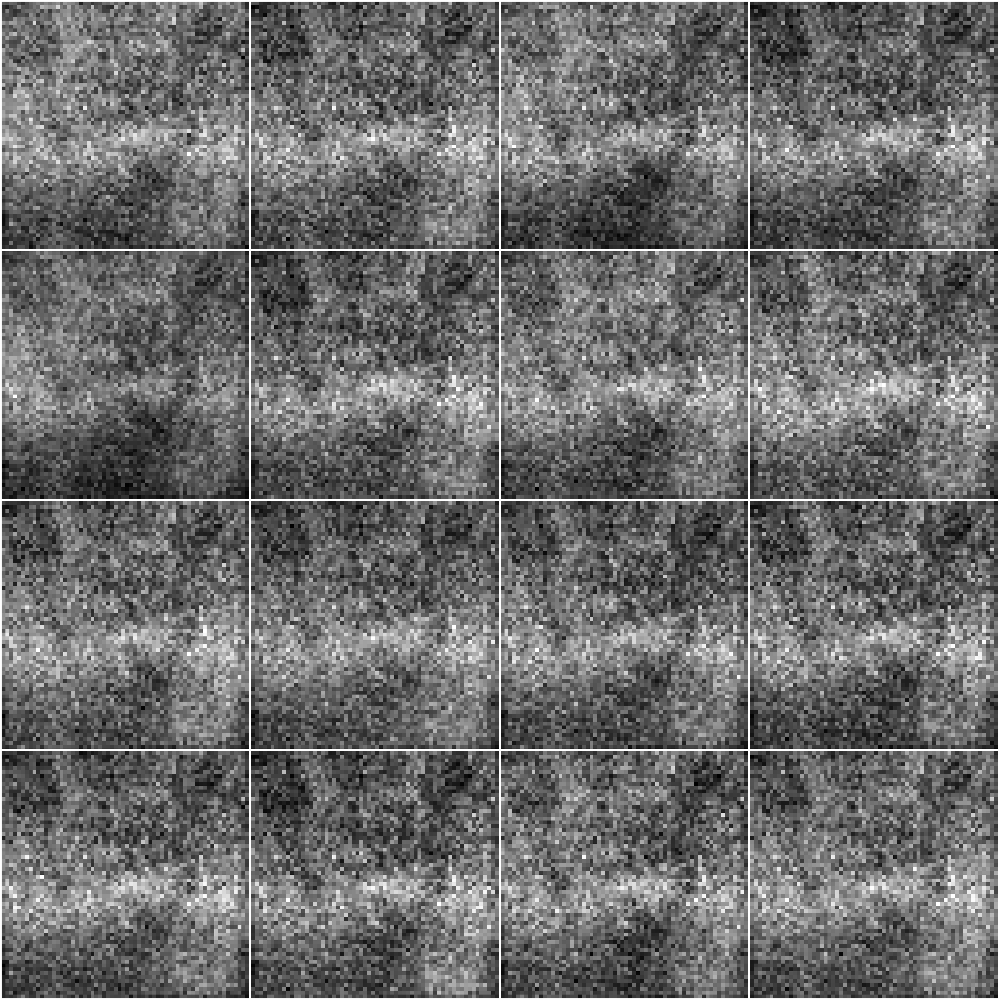

Starting training for letter: V
Completed Epoch 1/50, Epoch Duration: 0.16s, Total Loss D.: 0.3418, Total Loss G.: 1.5578
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.3063, Total Loss G.: 2.2815
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.1097, Total Loss G.: 3.3493
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.2437, Total Loss G.: 4.4148
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0855, Total Loss G.: 5.5074
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.2035, Total Loss G.: 5.0116
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.0184, Total Loss G.: 4.4779
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.0351, Total Loss G.: 4.1837
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0184, Total Loss G.: 3.6424
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.1047, Total Loss G.: 3.9906
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0279

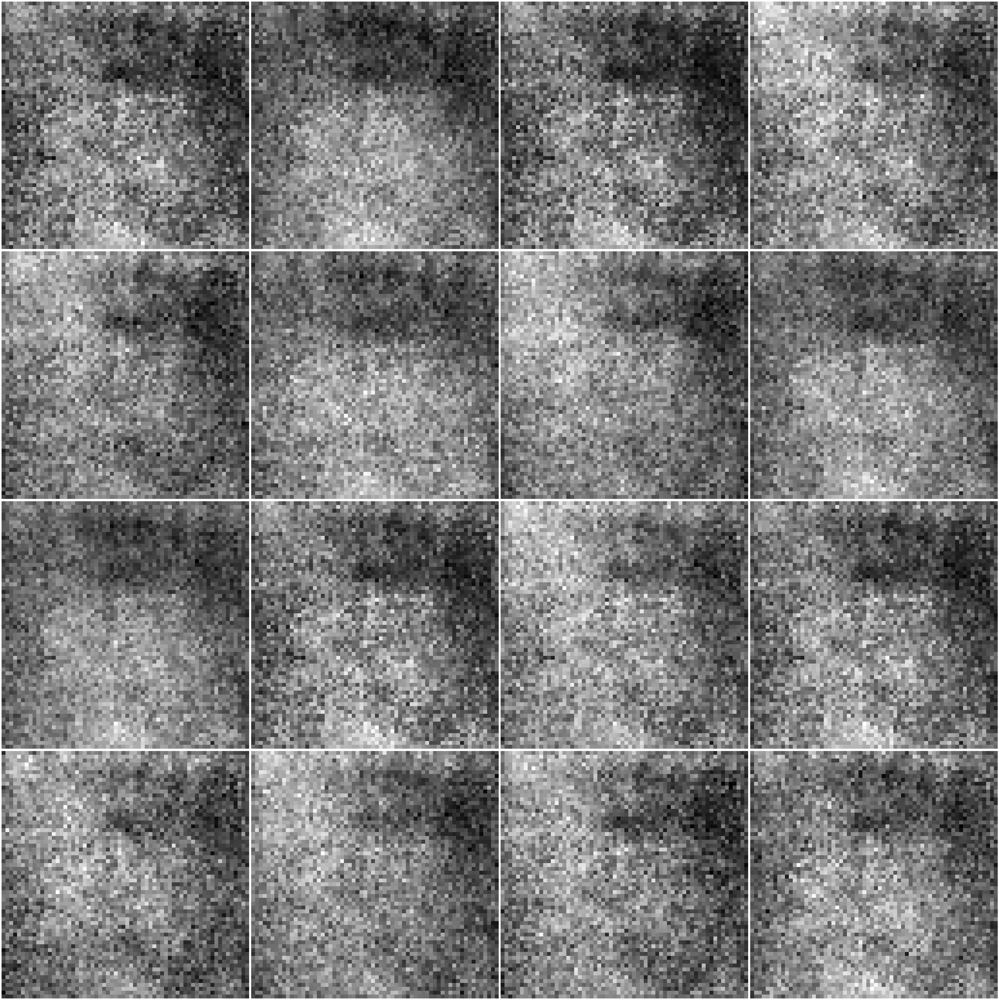

Starting training for letter: Q
Completed Epoch 1/50, Epoch Duration: 0.19s, Total Loss D.: 0.9864, Total Loss G.: 3.3378
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.3762, Total Loss G.: 3.6190
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.2757, Total Loss G.: 3.5504
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.0740, Total Loss G.: 4.4887
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0652, Total Loss G.: 3.0966
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0720, Total Loss G.: 4.3717
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.0631, Total Loss G.: 4.9811
Completed Epoch 8/50, Epoch Duration: 0.16s, Total Loss D.: 0.0268, Total Loss G.: 4.7130
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0299, Total Loss G.: 4.7994
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0401, Total Loss G.: 3.6776
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0755

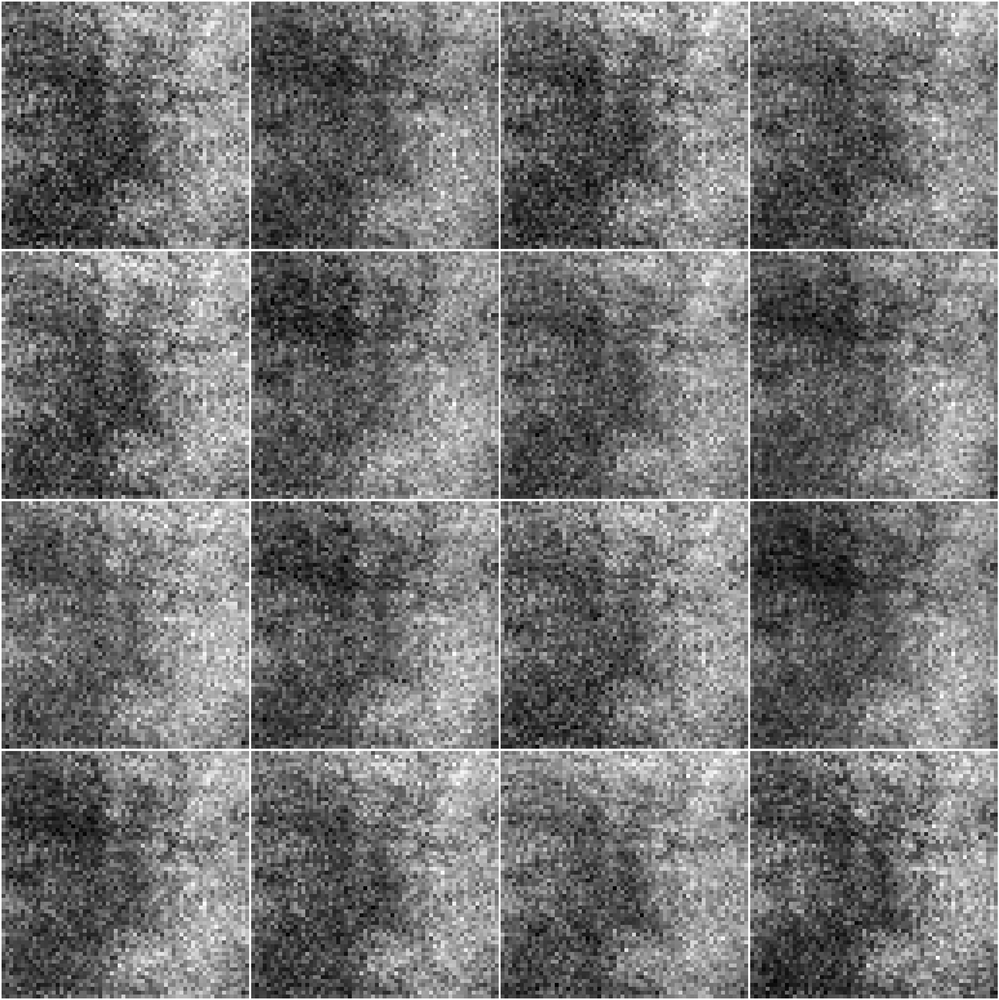

Starting training for letter: X
Completed Epoch 1/50, Epoch Duration: 0.25s, Total Loss D.: 0.0315, Total Loss G.: 3.7069
Completed Epoch 2/50, Epoch Duration: 0.23s, Total Loss D.: 0.0076, Total Loss G.: 11.0100
Completed Epoch 3/50, Epoch Duration: 0.23s, Total Loss D.: 0.0021, Total Loss G.: 4.9063
Completed Epoch 4/50, Epoch Duration: 0.22s, Total Loss D.: 0.0381, Total Loss G.: 4.0362
Completed Epoch 5/50, Epoch Duration: 0.23s, Total Loss D.: 0.0408, Total Loss G.: 2.4386
Completed Epoch 6/50, Epoch Duration: 0.24s, Total Loss D.: 0.0550, Total Loss G.: 2.3091
Completed Epoch 7/50, Epoch Duration: 0.23s, Total Loss D.: 0.0540, Total Loss G.: 2.8938
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.0545, Total Loss G.: 3.5014
Completed Epoch 9/50, Epoch Duration: 0.23s, Total Loss D.: 0.0090, Total Loss G.: 4.8763
Completed Epoch 10/50, Epoch Duration: 0.23s, Total Loss D.: 0.0183, Total Loss G.: 3.6406
Completed Epoch 11/50, Epoch Duration: 0.22s, Total Loss D.: 0.033

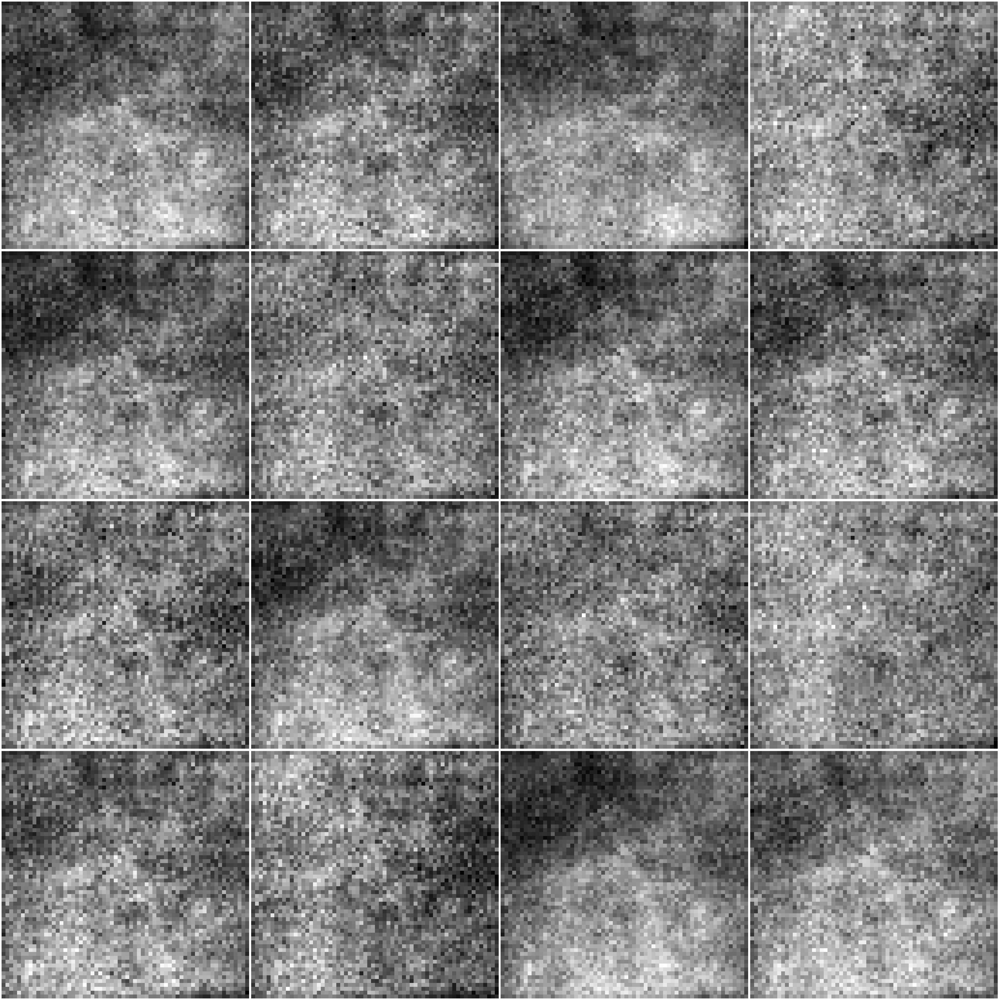

Starting training for letter: E
Completed Epoch 1/50, Epoch Duration: 0.23s, Total Loss D.: 0.6759, Total Loss G.: 1.2817
Completed Epoch 2/50, Epoch Duration: 0.22s, Total Loss D.: 0.1404, Total Loss G.: 3.7850
Completed Epoch 3/50, Epoch Duration: 0.22s, Total Loss D.: 0.1899, Total Loss G.: 4.4019
Completed Epoch 4/50, Epoch Duration: 0.22s, Total Loss D.: 0.0003, Total Loss G.: 4.1711
Completed Epoch 5/50, Epoch Duration: 0.21s, Total Loss D.: 0.0288, Total Loss G.: 3.8918
Completed Epoch 6/50, Epoch Duration: 0.22s, Total Loss D.: 0.0289, Total Loss G.: 3.7674
Completed Epoch 7/50, Epoch Duration: 0.22s, Total Loss D.: 0.0380, Total Loss G.: 1.7925
Completed Epoch 8/50, Epoch Duration: 0.21s, Total Loss D.: 0.1897, Total Loss G.: 2.8431
Completed Epoch 9/50, Epoch Duration: 0.22s, Total Loss D.: 1.2066, Total Loss G.: 3.1086
Completed Epoch 10/50, Epoch Duration: 0.22s, Total Loss D.: 0.4672, Total Loss G.: 0.4155
Completed Epoch 11/50, Epoch Duration: 0.21s, Total Loss D.: 0.0778

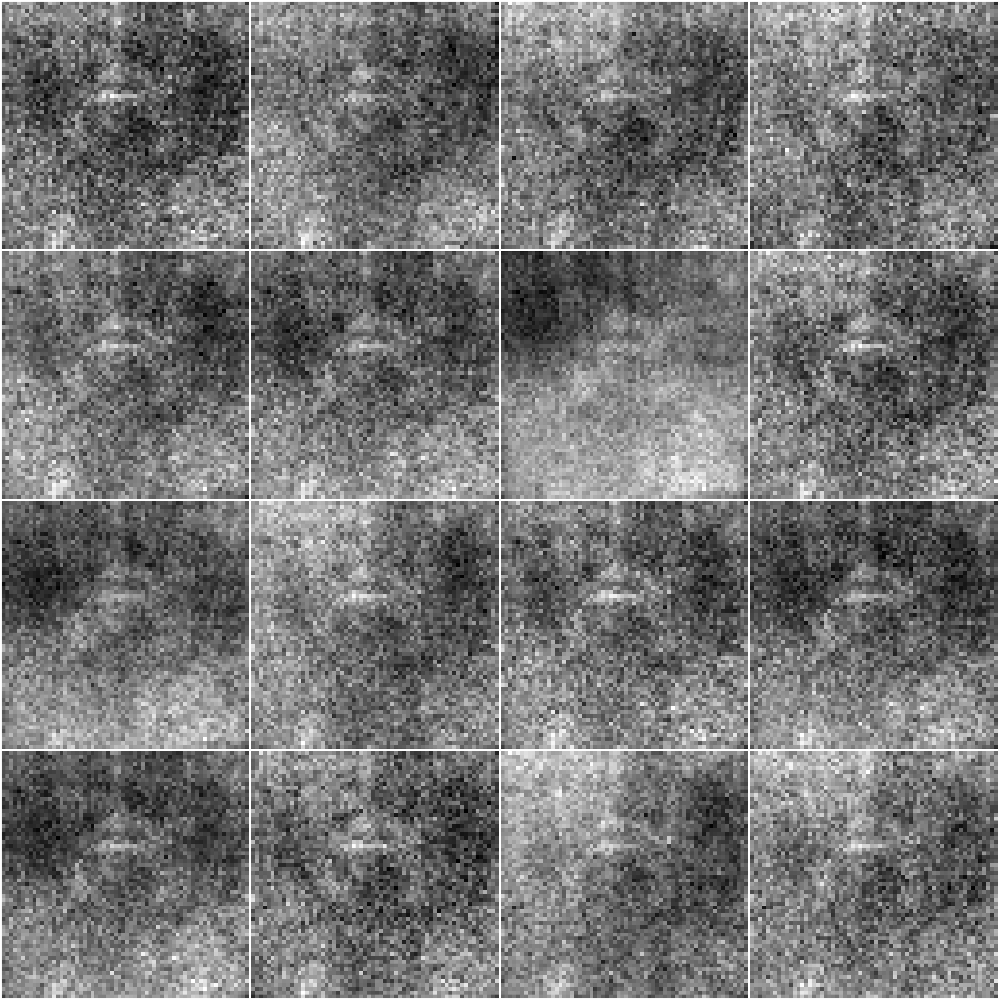

Starting training for letter: B
Completed Epoch 1/50, Epoch Duration: 0.16s, Total Loss D.: 0.0267, Total Loss G.: 3.6156
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.1255, Total Loss G.: 2.9350
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.0659, Total Loss G.: 4.2679
Completed Epoch 4/50, Epoch Duration: 0.14s, Total Loss D.: 0.1852, Total Loss G.: 2.2547
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.1296, Total Loss G.: 4.3312
Completed Epoch 6/50, Epoch Duration: 0.14s, Total Loss D.: 0.0234, Total Loss G.: 4.9665
Completed Epoch 7/50, Epoch Duration: 0.42s, Total Loss D.: 0.1125, Total Loss G.: 6.9129
Completed Epoch 8/50, Epoch Duration: 0.24s, Total Loss D.: 0.0187, Total Loss G.: 5.4656
Completed Epoch 9/50, Epoch Duration: 0.16s, Total Loss D.: 0.0431, Total Loss G.: 3.7477
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0821, Total Loss G.: 3.1282
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0618

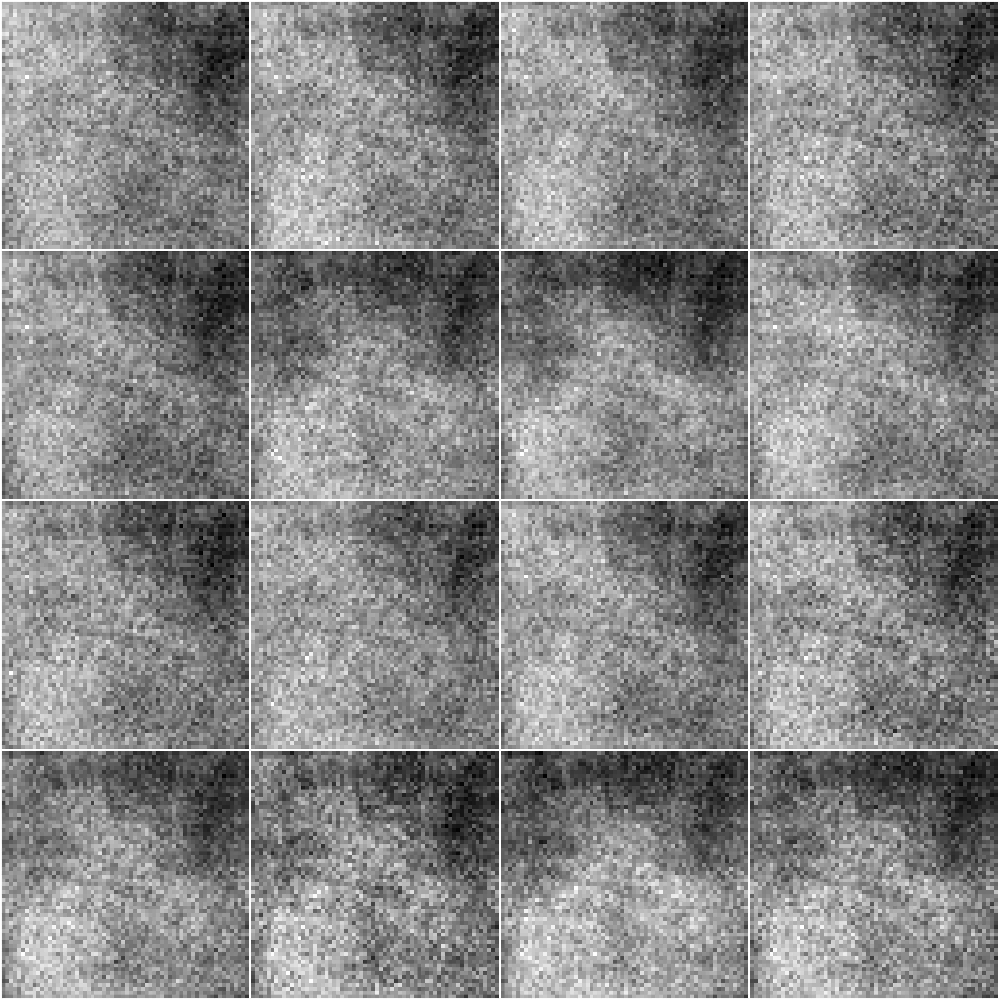

Starting training for letter: K
Completed Epoch 1/50, Epoch Duration: 0.18s, Total Loss D.: 0.2813, Total Loss G.: 4.1968
Completed Epoch 2/50, Epoch Duration: 0.14s, Total Loss D.: 0.3996, Total Loss G.: 3.1842
Completed Epoch 3/50, Epoch Duration: 0.14s, Total Loss D.: 0.1566, Total Loss G.: 4.8404
Completed Epoch 4/50, Epoch Duration: 0.14s, Total Loss D.: 0.0647, Total Loss G.: 5.3852
Completed Epoch 5/50, Epoch Duration: 0.14s, Total Loss D.: 0.0071, Total Loss G.: 8.2260
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.0027, Total Loss G.: 9.4349
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.1030, Total Loss G.: 7.8951
Completed Epoch 8/50, Epoch Duration: 0.14s, Total Loss D.: 0.0083, Total Loss G.: 5.7604
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0877, Total Loss G.: 3.3702
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.1407, Total Loss G.: 3.6356
Completed Epoch 11/50, Epoch Duration: 0.15s, Total Loss D.: 0.0533

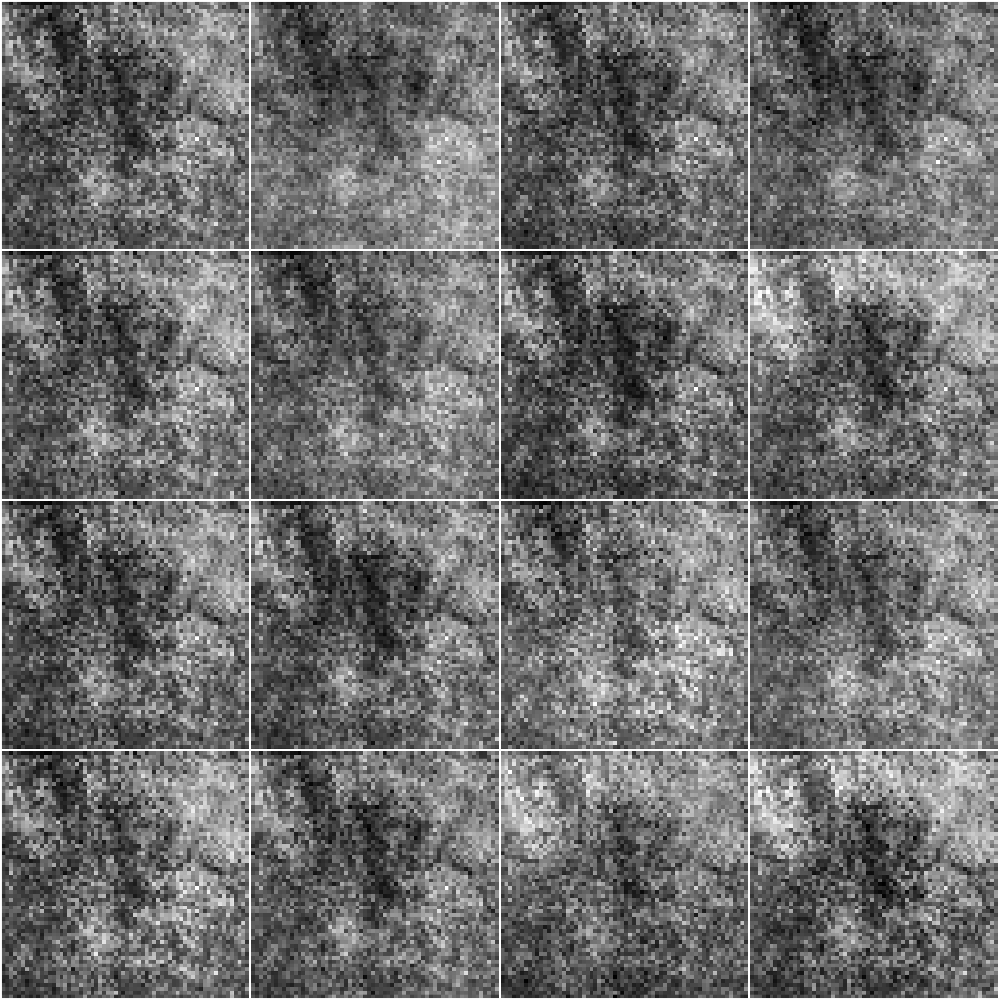

Starting training for letter: L
Completed Epoch 1/50, Epoch Duration: 0.25s, Total Loss D.: 1.4558, Total Loss G.: 3.1392
Completed Epoch 2/50, Epoch Duration: 0.22s, Total Loss D.: 0.2369, Total Loss G.: 3.7443
Completed Epoch 3/50, Epoch Duration: 0.22s, Total Loss D.: 0.1734, Total Loss G.: 4.6300
Completed Epoch 4/50, Epoch Duration: 0.23s, Total Loss D.: 0.0383, Total Loss G.: 4.4786
Completed Epoch 5/50, Epoch Duration: 0.22s, Total Loss D.: 0.1650, Total Loss G.: 4.3303
Completed Epoch 6/50, Epoch Duration: 0.22s, Total Loss D.: 0.3348, Total Loss G.: 4.8207
Completed Epoch 7/50, Epoch Duration: 0.22s, Total Loss D.: 0.1020, Total Loss G.: 4.3819
Completed Epoch 8/50, Epoch Duration: 0.22s, Total Loss D.: 0.2851, Total Loss G.: 2.5404
Completed Epoch 9/50, Epoch Duration: 0.23s, Total Loss D.: 0.2785, Total Loss G.: 3.5722
Completed Epoch 10/50, Epoch Duration: 0.24s, Total Loss D.: 0.0208, Total Loss G.: 5.3158
Completed Epoch 11/50, Epoch Duration: 0.54s, Total Loss D.: 0.0977

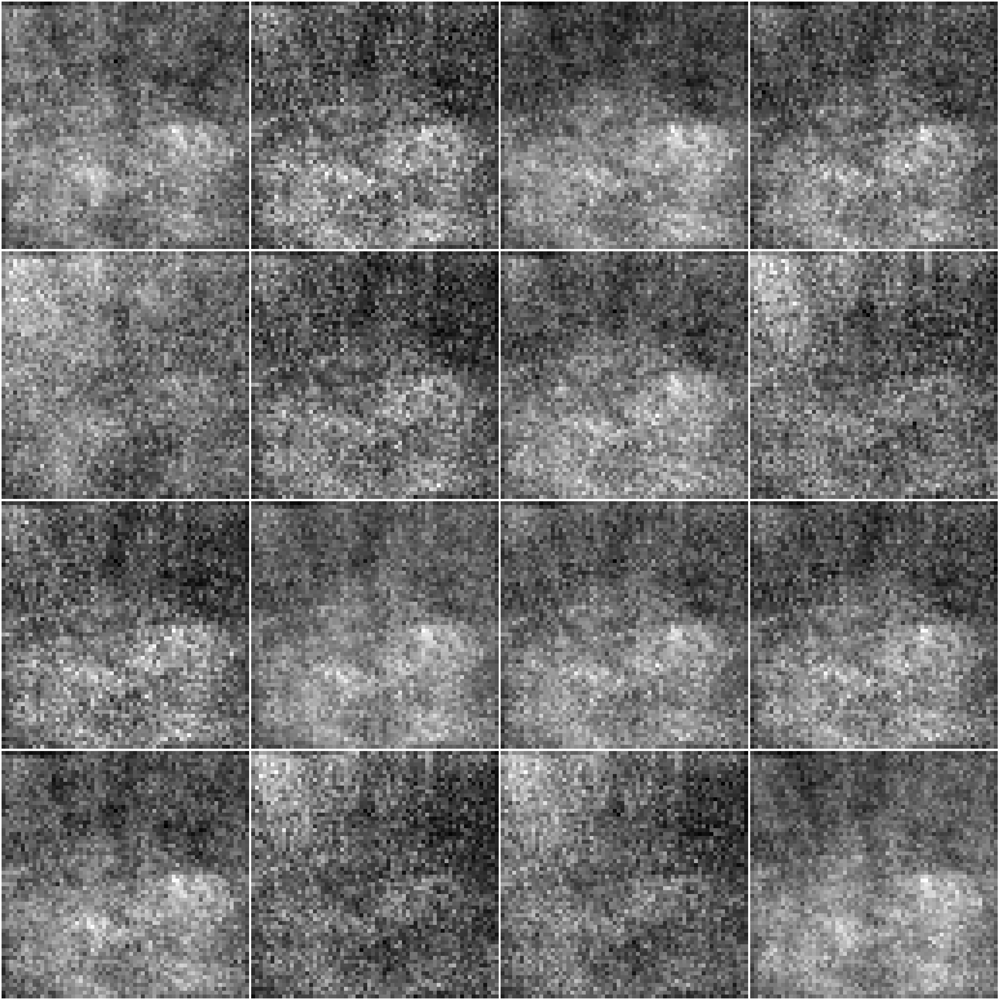

Starting training for letter: Y
Completed Epoch 1/50, Epoch Duration: 0.44s, Total Loss D.: 0.4199, Total Loss G.: 3.1253
Completed Epoch 2/50, Epoch Duration: 0.18s, Total Loss D.: 0.4082, Total Loss G.: 1.5665
Completed Epoch 3/50, Epoch Duration: 0.17s, Total Loss D.: 0.1646, Total Loss G.: 2.0338
Completed Epoch 4/50, Epoch Duration: 0.14s, Total Loss D.: 0.0906, Total Loss G.: 2.8691
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.1782, Total Loss G.: 3.6649
Completed Epoch 6/50, Epoch Duration: 0.14s, Total Loss D.: 0.1414, Total Loss G.: 3.8703
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.2160, Total Loss G.: 2.9617
Completed Epoch 8/50, Epoch Duration: 0.15s, Total Loss D.: 0.1342, Total Loss G.: 1.8643
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.2104, Total Loss G.: 1.7217
Completed Epoch 10/50, Epoch Duration: 0.15s, Total Loss D.: 0.0712, Total Loss G.: 2.7075
Completed Epoch 11/50, Epoch Duration: 0.14s, Total Loss D.: 0.0887

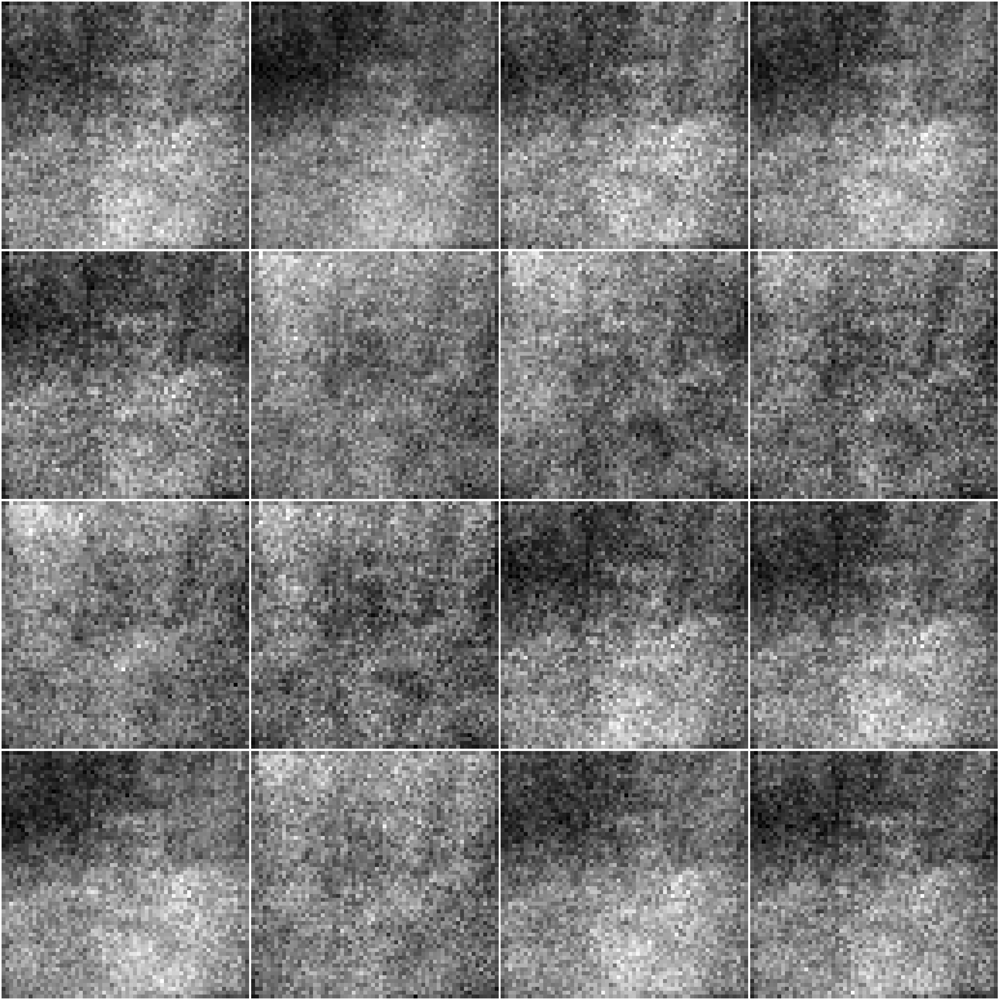

Starting training for letter: P
Completed Epoch 1/50, Epoch Duration: 0.20s, Total Loss D.: 1.0452, Total Loss G.: 4.6274
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.1244, Total Loss G.: 2.7736
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.1789, Total Loss G.: 3.9371
Completed Epoch 4/50, Epoch Duration: 0.19s, Total Loss D.: 0.2551, Total Loss G.: 6.1620
Completed Epoch 5/50, Epoch Duration: 0.23s, Total Loss D.: 0.0782, Total Loss G.: 8.0252
Completed Epoch 6/50, Epoch Duration: 0.15s, Total Loss D.: 0.2348, Total Loss G.: 7.5062
Completed Epoch 7/50, Epoch Duration: 0.53s, Total Loss D.: 0.0098, Total Loss G.: 5.3183
Completed Epoch 8/50, Epoch Duration: 0.16s, Total Loss D.: 0.0934, Total Loss G.: 4.5349
Completed Epoch 9/50, Epoch Duration: 0.18s, Total Loss D.: 0.1026, Total Loss G.: 3.9731
Completed Epoch 10/50, Epoch Duration: 0.18s, Total Loss D.: 0.4338, Total Loss G.: 4.2938
Completed Epoch 11/50, Epoch Duration: 0.25s, Total Loss D.: 0.2552

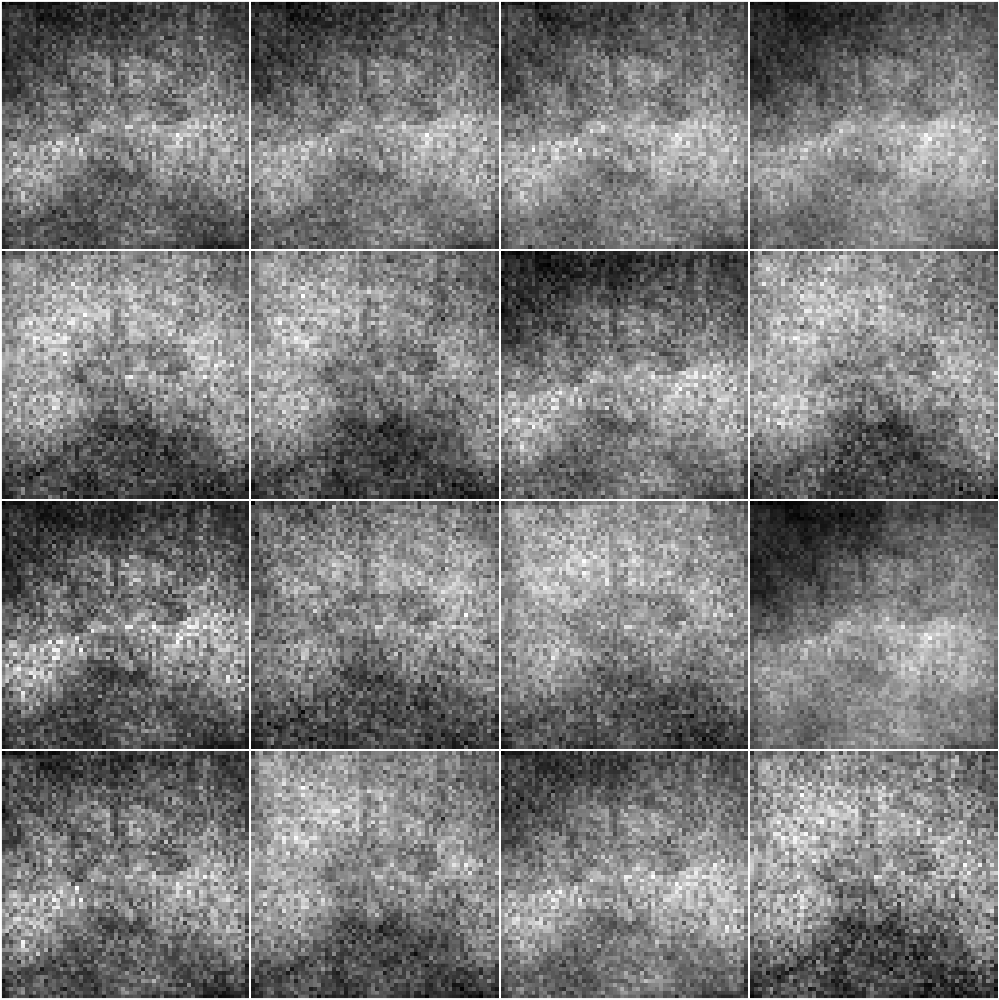

Starting training for letter: W
Completed Epoch 1/50, Epoch Duration: 0.22s, Total Loss D.: 0.1833, Total Loss G.: 3.2285
Completed Epoch 2/50, Epoch Duration: 0.15s, Total Loss D.: 0.1147, Total Loss G.: 2.5161
Completed Epoch 3/50, Epoch Duration: 0.15s, Total Loss D.: 0.0935, Total Loss G.: 2.2888
Completed Epoch 4/50, Epoch Duration: 0.15s, Total Loss D.: 0.0654, Total Loss G.: 2.8371
Completed Epoch 5/50, Epoch Duration: 0.15s, Total Loss D.: 0.0612, Total Loss G.: 3.5798
Completed Epoch 6/50, Epoch Duration: 0.14s, Total Loss D.: 0.0308, Total Loss G.: 4.5617
Completed Epoch 7/50, Epoch Duration: 0.15s, Total Loss D.: 0.0223, Total Loss G.: 4.6766
Completed Epoch 8/50, Epoch Duration: 0.16s, Total Loss D.: 0.0368, Total Loss G.: 4.7116
Completed Epoch 9/50, Epoch Duration: 0.15s, Total Loss D.: 0.0145, Total Loss G.: 4.4082
Completed Epoch 10/50, Epoch Duration: 0.16s, Total Loss D.: 0.0191, Total Loss G.: 5.0918
Completed Epoch 11/50, Epoch Duration: 0.14s, Total Loss D.: 0.0213

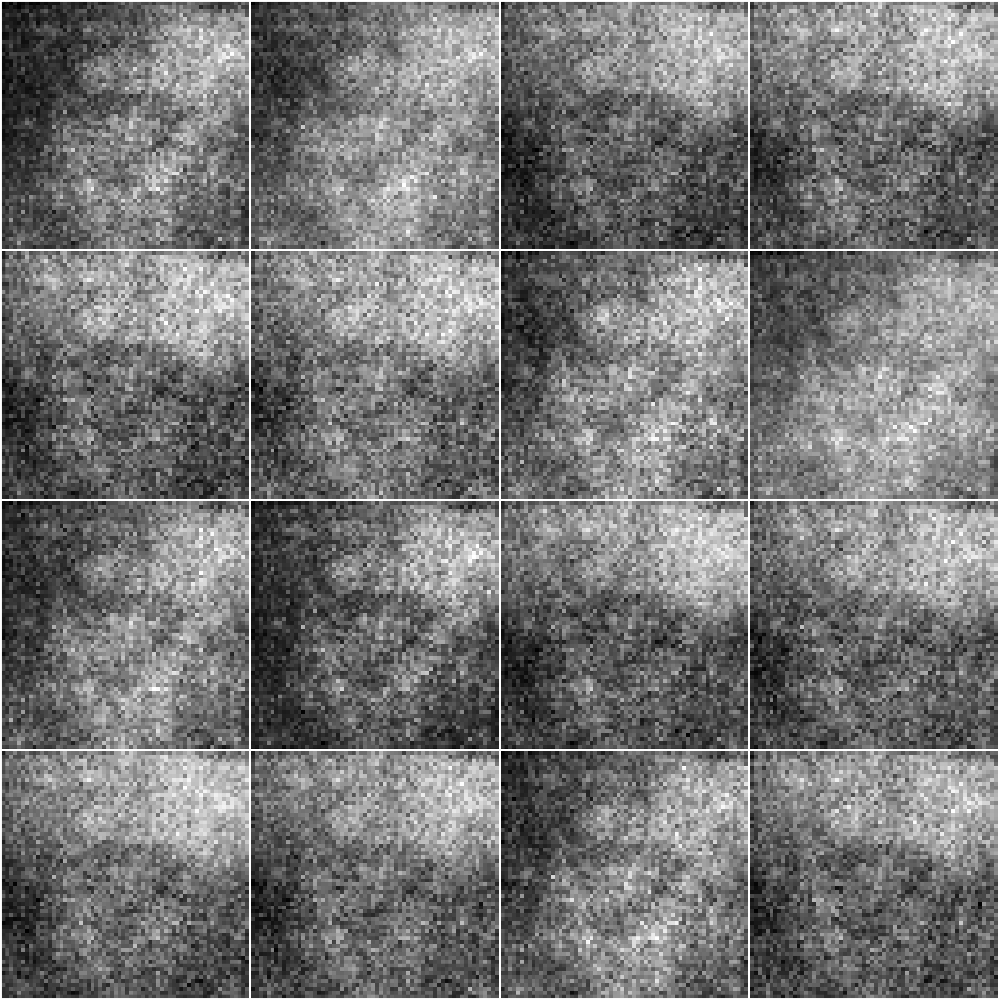

In [34]:
images_dict = {letter: None for letter in string.ascii_lowercase}

# training loop
for letter, dataloader in gan_dataloaders.items():
    print(f"Starting training for letter: {letter}")
    for epoch in range(num_epochs):
        start_time_epoch = time.time()
        for n, (real_samples, _) in enumerate(dataloader):
                start_time_batch = time.time()

                batch_size_current = real_samples.size(0)
                real_samples = real_samples.to(device=device)
                real_samples_labels = torch.ones((batch_size_current, 1), device=device)

                # generate samples and corresponding images
                latent_space_samples = torch.randn((batch_size_current, 100), device=device)
                generated_samples = generator(latent_space_samples)
                generated_samples_labels = torch.zeros((batch_size_current, 1), device=device)

                all_samples = torch.cat((real_samples, generated_samples), dim=0)
                all_samples_labels = torch.cat((real_samples_labels, generated_samples_labels), dim=0)

                discriminator.zero_grad()

                # obtain discriminator predictions and update discriminator parameters
                output_discriminator = discriminator(all_samples)
                loss_discriminator = loss_function(output_discriminator, all_samples_labels)
                loss_discriminator.backward()
                optimizer_discriminator.step()

                # generate new samples and update generator parameters
                generator.zero_grad()
                latent_space_samples = torch.randn((batch_size_current, 100), device=device)
                generated_samples = generator(latent_space_samples)
                output_discriminator_generated = discriminator(generated_samples)
                loss_generator = loss_function(output_discriminator_generated, real_samples_labels) 
                loss_generator.backward()
                optimizer_generator.step()

                end_time_batch = time.time()
                batch_duration = end_time_batch - start_time_batch


        end_time_epoch = time.time()
        epoch_duration = end_time_epoch - start_time_epoch 
        print(f"Completed Epoch {epoch+1}/{num_epochs}, "
            f"Epoch Duration: {epoch_duration:.2f}s, "
            f"Total Loss D.: {loss_discriminator.item():.4f}, " 
            f"Total Loss G.: {loss_generator.item():.4f}")
        
    latent_space_samples = torch.randn(32, 100).to(device=device)
    generated_samples = generator(latent_space_samples) 
    generated_samples = generated_samples.cpu().detach()
    images_dict[letter.lower()] = generated_samples
    show_asl(16, 4, 4, generated_samples)

In [37]:
# display images cororesponding to input word
def display_images(word):
    word = word.lower()
    num_letters = len(word)
    if num_letters == 0:
        print("Please enter a word to display the images.")
        return

    if num_letters == 1:
        fig, axs = plt.subplots(1, 1, figsize=(3, 4))
        axs = [axs]  
    else:
        fig, axs = plt.subplots(1, num_letters, figsize=(3 * num_letters, 4))

    for i, letter in enumerate(word):
        img_tensor = images_dict.get(letter, None)
        if img_tensor is not None:
            axs[i].imshow(img_tensor[0].reshape(64, 64), cmap='gray')
            axs[i].set_title(f'Letter: {letter}')
        else:
            axs[i].text(0.5, 0.5, 'Image not found', fontsize=15, ha='center')
        axs[i].axis('off')
    plt.show()

# define input textbox widget
text_box = widgets.Text(
    value='',
    placeholder='Type something',
    description='Input:',
    disabled=False
)

output = widgets.Output()

# define event handler for text change
def on_text_change(change):
    with output:
        clear_output(wait=True)
        display_images(change['new'])

text_box.observe(on_text_change, names='value')

# display widgets
display(text_box, output)

Text(value='', description='Input:', placeholder='Type something')

Output()